In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1316, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 1316 (delta 50), reused 57 (delta 25), pack-reused 1227
Receiving objects: 100% (1316/1316), 57.47 MiB | 39.08 MiB/s, done.
Resolving deltas: 100% (934/934), done.


In [ ]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_SkewedPrior import make_lm_program_gamma_prior, make_lm_program_gamma_prior_batched

from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2, TransformerPlusNLP
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured

In [ ]:
torch.backends.cudnn.benchmark = True

In [ ]:
make_lm_program = make_lm_program_gamma_prior
make_lm_program_batched= make_lm_program_gamma_prior_batched

N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InvGammaGammPrior_LearnedBaseDist_plus_nll_Fm_on_top"
#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 1.0
alpha = 0.5

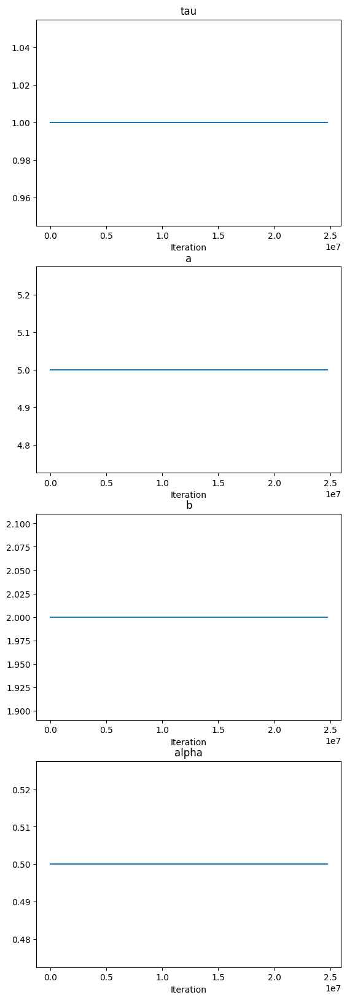

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),
    ("alpha", curriculum.constant_scheduler(alpha))

    ]
)
curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(99*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0, 'alpha': 0.5}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_batched,
    curriculum= curriculum,
)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 11.93it/s]

torch.Size([10000, 5])
{'X': {'mean': tensor(0.4997), 'variance': tensor(0.0832), 'min': tensor(1.0729e-06), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.2188), 'variance': tensor(1.2261), 'min': tensor(-8.2559), 'max': tensor(12.1968)}, 'beta': {'mean': tensor([0.5011, 0.4728, 0.4972, 0.4861, 0.4828]), 'variance': tensor([0.4728, 0.4848, 0.5257, 0.4573, 0.4830]), 'min': tensor([1.3898e-08, 4.4216e-08, 1.2115e-08, 1.3175e-06, 8.7647e-08]), 'max': tensor([5.7850, 8.3548, 9.0096, 5.1619, 8.9095])}}
Statistics for sigma_squared:
Mean: tensor([0.5023])
Variance: tensor([0.0868])
Min: tensor([0.1319])


Max: tensor([3.6623])


Statistics for time:
Mean: 0.500137585029006
Variance: 0.08298778657546368
Min: 0.0002402663230895996
Max: 0.9993054270744324


Statistics for base_sample_beta:
Mean: tensor([-7.2307e-03, -1.9593e-02, -4.6719e-03, -6.3151e-05,  3.2851e-03])
Variance: tensor([1.0074, 0.9923, 0.9617, 1.0379, 1.0140])
Min: tensor([-3.5154, -3.8605, -3.3506, -3.4217, -3.8995])
Max: tensor([3.1652, 3.4264, 3.0545, 3.9072, 3.3291])




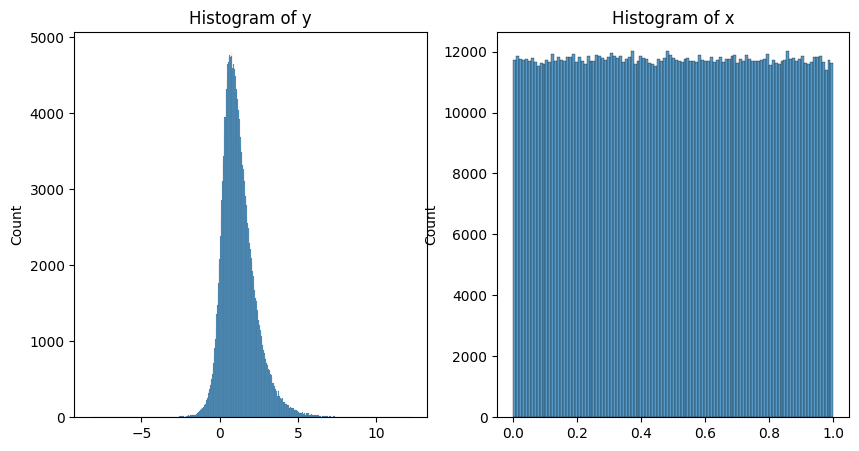

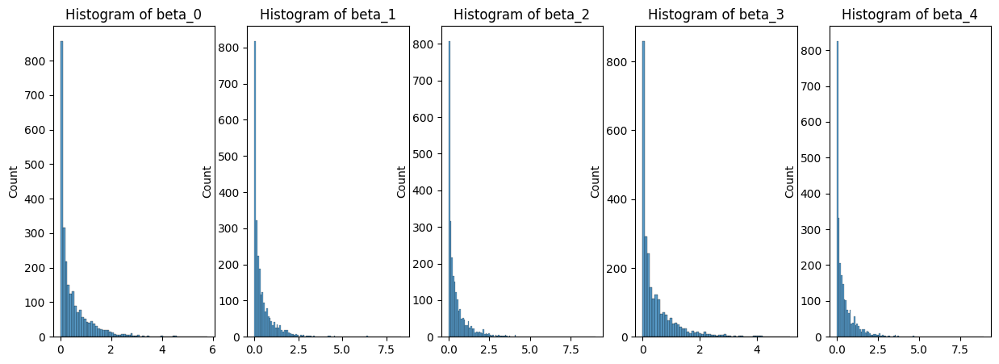

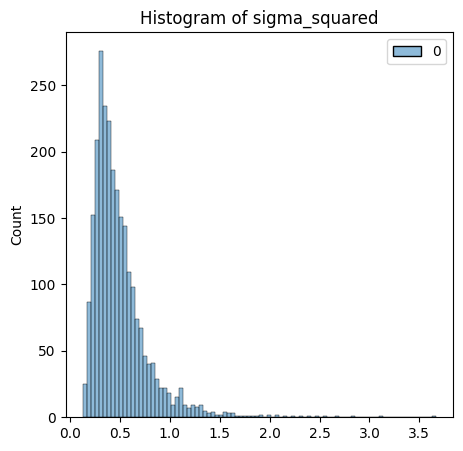

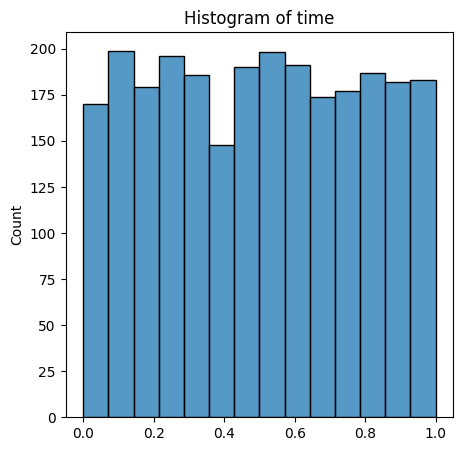

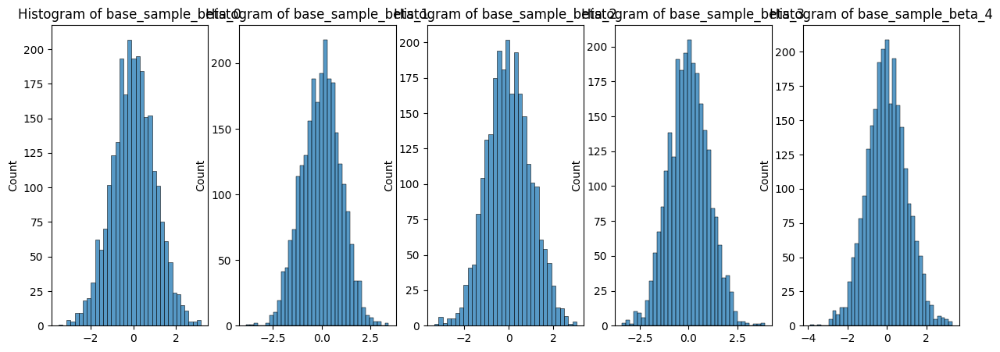

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 73.07it/s]

torch.Size([10000, 5])
{'X': {'mean': tensor(0.4997), 'variance': tensor(0.0834), 'min': tensor(5.9605e-08), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.2788), 'variance': tensor(1.3285), 'min': tensor(-8.5647), 'max': tensor(11.4281)}, 'beta': {'mean': tensor([0.5266, 0.5130, 0.4979, 0.5033, 0.5158]), 'variance': tensor([0.5853, 0.5310, 0.4555, 0.4948, 0.5151]), 'min': tensor([1.1327e-06, 5.1951e-07, 1.6809e-09, 2.7263e-08, 2.8958e-07]), 'max': tensor([8.6443, 6.9002, 5.8624, 6.6813, 5.5112])}}
Statistics for sigma_squared:
Mean: tensor([0.4953])
Variance: tensor([0.0800])
Min: tensor([0.1235])
Max: tensor([3.5992])


Statistics for time:
Mean: 0.49875669162720443
Variance: 0.08228664949472185
Min: 0.000652313232421875
Max: 0.9996998906135559




Statistics for base_sample_beta:
Mean: tensor([ 0.0047,  0.0160,  0.0173,  0.0268, -0.0069])
Variance: tensor([1.0060, 0.9953, 0.9769, 0.9528, 1.0663])
Min: tensor([-3.6357, -3.4582, -3.1158, -3.2536, -3.7063])
Max: tensor([3.7599, 3.2748, 3.7250, 3.1606, 3.5362])




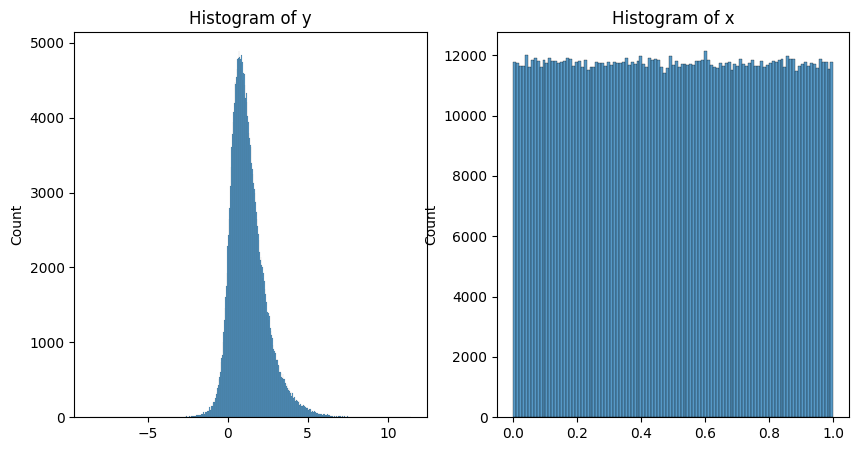

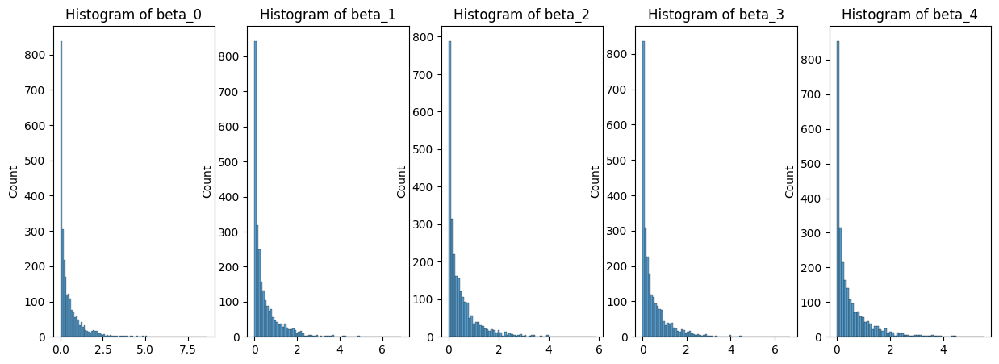

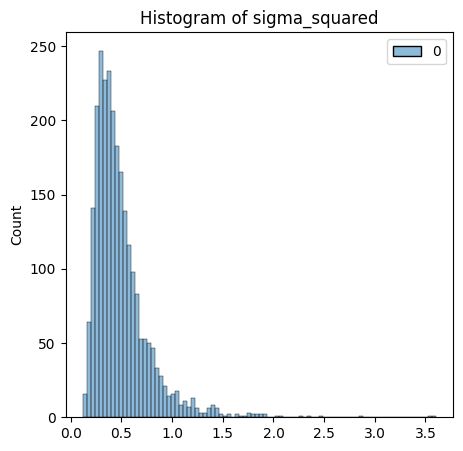

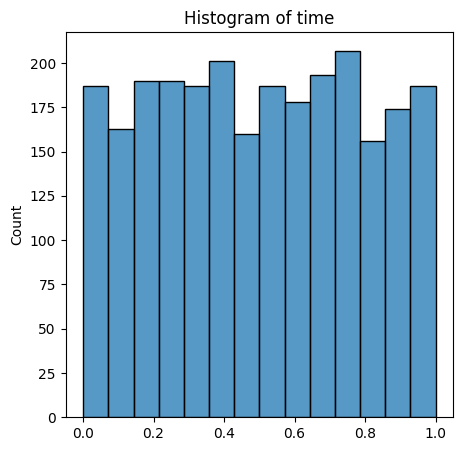

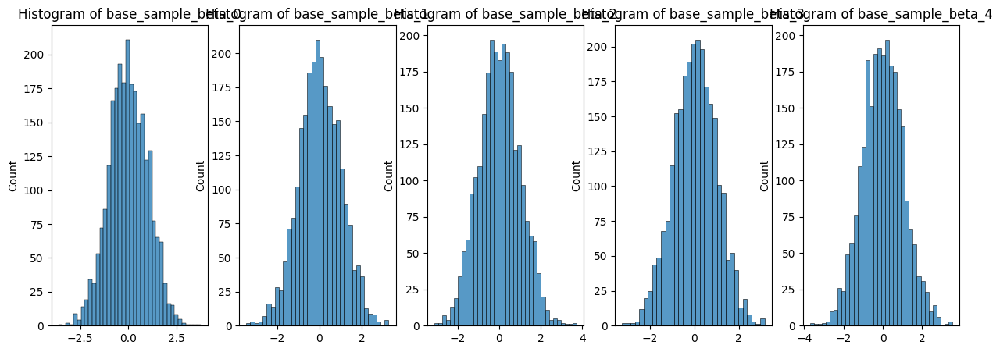

[{'X': {'mean': tensor(0.4997),
   'variance': tensor(0.0832),
   'min': tensor(1.0729e-06),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.2188),
   'variance': tensor(1.2261),
   'min': tensor(-8.2559),
   'max': tensor(12.1968)},
  'beta': {'mean': tensor([0.5011, 0.4728, 0.4972, 0.4861, 0.4828]),
   'variance': tensor([0.4728, 0.4848, 0.5257, 0.4573, 0.4830]),
   'min': tensor([1.3898e-08, 4.4216e-08, 1.2115e-08, 1.3175e-06, 8.7647e-08]),
   'max': tensor([5.7850, 8.3548, 9.0096, 5.1619, 8.9095])}},
 {'X': {'mean': tensor(0.4997),
   'variance': tensor(0.0834),
   'min': tensor(5.9605e-08),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.2788),
   'variance': tensor(1.3285),
   'min': tensor(-8.5647),
   'max': tensor(11.4281)},
  'beta': {'mean': tensor([0.5266, 0.5130, 0.4979, 0.5033, 0.5158]),
   'variance': tensor([0.5853, 0.5310, 0.4555, 0.4948, 0.5151]),
   'min': tensor([1.1327e-06, 5.1951e-07, 1.6809e-09, 2.7263e-08, 2.8958e-07]),
   'max': tensor([8.6443, 6.9002, 

In [ ]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

torch.Size([1, 10])
(1, 10)


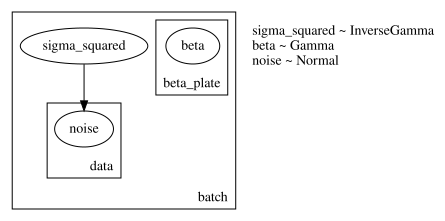

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
#save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [ ]:
model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 384,
    n_heads= 6,
    dim_feedforward=384*2,
    dropout_rate = 0.1,
    n_layers=7,
    n_skip_layers_final_heads = 3,
    n_output_units_per_head=[P, P*P, P]
)

encoder_to_process_encoder_output = torch.nn.TransformerEncoder(
    torch.nn.TransformerEncoderLayer(d_model=encoder.d_model,
                                     nhead=encoder.n_heads,
                                     dim_feedforward = encoder.dim_feedforward,
                                     batch_first = True,
                                     norm_first = True),
    num_layers=4)


#encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples


mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)

model_to_process_encoder_output_for_decoder = TransformerPlusNLP(
    transformer_encoder = encoder_to_process_encoder_output,
    mlp = mlp_to_process_encoder_output
)


mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 4,
    d_ff = 512,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 4,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 512,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
    encoder = encoder,
    model_posterior = model_posterior,
    model_to_process_encoder_output = model_to_process_encoder_output_for_decoder,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)




/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'5.31e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=0.0,
    return_sub_losses=True
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor= 1e3)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0,
    stop_gradients_from_FM_to_encoder = False,
    coupling = None
)

In [ ]:
#trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_23_19_03_15")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_25_18_59_13'

In [ ]:
try:
  trainer.load_best_model()
except Exception as e:
  print("Could not load model")
  print(e)
  pass

Could not load model
[Errno 2] No such file or directory: '/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_25_18_59_13/model.pth'


In [ ]:
trainer.validate()

  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:16<00:00,  3.00it/s]


{'loss_mean': 81.15998077392578,
 'loss_median': 80.80674743652344,
 'loss_std': 2.792909860610962,
 'loss_FM_mean': 0.8318440914154053,
 'loss_FM_median': 0.8299898505210876,
 'loss_FM_std': 0.02204434759914875,
 'loss_NLL_mean': 161.48812866210938,
 'loss_NLL_median': 160.79129028320312,
 'loss_NLL_std': 5.568295955657959}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'alpha': 0.5} at iteration 0


  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 0:
Training: {'loss_mean': 10.967901229858398, 'loss_median': 10.995997428894043, 'loss_std': 0.6414266228675842, 'loss_FM_mean': 4.639953136444092, 'loss_FM_median': 4.719092845916748, 'loss_FM_std': 0.3342740833759308, 'loss_NLL_mean': 17.295848846435547, 'loss_NLL_median': 17.220060348510742, 'loss_NLL_std': 0.9778090715408325}
Validation: {'loss_mean': 7.095754146575928, 'loss_median': 7.0575785636901855, 'loss_std': 0.2509877681732178, 'loss_FM_mean': 1.7614119052886963, 'loss_FM_median': 1.7058738470077515, 'loss_FM_std': 0.468136191368103, 'loss_NLL_mean': 12.430095672607422, 'loss_NLL_median': 12.4014310836792, 'loss_NLL_std': 0.1644728183746338}
Validation curriculum: {'loss_mean': 7.05619478225708, 'loss_median': 7.053969860076904, 'loss_std': 0.07370420545339584, 'loss_FM_mean': 1.6935019493103027, 'loss_FM_median': 1.6952927112579346, 'loss_FM_std': 0.0397142618894577, 'loss_NLL_mean': 12.418889045715332, 'loss_NLL_median': 12.443145751953125, 'loss_NLL_std': 0.133528

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 1:
Training: {'loss_mean': 8.893460273742676, 'loss_median': 8.831408500671387, 'loss_std': 0.5107870101928711, 'loss_FM_mean': 3.278553009033203, 'loss_FM_median': 3.225874662399292, 'loss_FM_std': 0.337820827960968, 'loss_NLL_mean': 14.508367538452148, 'loss_NLL_median': 14.438207626342773, 'loss_NLL_std': 0.6953546404838562}
Validation: {'loss_mean': 6.087881088256836, 'loss_median': 6.0977983474731445, 'loss_std': 0.14256706833839417, 'loss_FM_mean': 1.3235116004943848, 'loss_FM_median': 1.3117364645004272, 'loss_FM_std': 0.07090366631746292, 'loss_NLL_mean': 10.852250099182129, 'loss_NLL_median': 10.861227035522461, 'loss_NLL_std': 0.239142507314682}
Validation curriculum: {'loss_mean': 6.099286079406738, 'loss_median': 6.08962869644165, 'loss_std': 0.11666805297136307, 'loss_FM_mean': 1.3224129676818848, 'loss_FM_median': 1.3164350986480713, 'loss_FM_std': 0.08031419664621353, 'loss_NLL_mean': 10.87615966796875, 'loss_NLL_median': 10.872245788574219, 'loss_NLL_std': 0.18497

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 2:
Training: {'loss_mean': 7.3885674476623535, 'loss_median': 7.415172576904297, 'loss_std': 0.41681817173957825, 'loss_FM_mean': 2.593759059906006, 'loss_FM_median': 2.588815689086914, 'loss_FM_std': 0.14743880927562714, 'loss_NLL_mean': 12.183375358581543, 'loss_NLL_median': 12.206583976745605, 'loss_NLL_std': 0.7169528603553772}
Validation: {'loss_mean': 5.307773590087891, 'loss_median': 5.272405624389648, 'loss_std': 0.15594597160816193, 'loss_FM_mean': 1.351030945777893, 'loss_FM_median': 1.299953818321228, 'loss_FM_std': 0.15934042632579803, 'loss_NLL_mean': 9.26451587677002, 'loss_NLL_median': 9.231340408325195, 'loss_NLL_std': 0.1996345967054367}
Validation curriculum: {'loss_mean': 5.325071811676025, 'loss_median': 5.314129829406738, 'loss_std': 0.1321932077407837, 'loss_FM_mean': 1.3447706699371338, 'loss_FM_median': 1.33537757396698, 'loss_FM_std': 0.13565748929977417, 'loss_NLL_mean': 9.305374145507812, 'loss_NLL_median': 9.296131134033203, 'loss_NLL_std': 0.184533730

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 3:
Training: {'loss_mean': 5.755709171295166, 'loss_median': 5.78245735168457, 'loss_std': 0.656893789768219, 'loss_FM_mean': 2.265523910522461, 'loss_FM_median': 2.2723729610443115, 'loss_FM_std': 0.15425416827201843, 'loss_NLL_mean': 9.245894432067871, 'loss_NLL_median': 9.342708587646484, 'loss_NLL_std': 1.2154043912887573}
Validation: {'loss_mean': 3.503246784210205, 'loss_median': 3.5090079307556152, 'loss_std': 0.15177617967128754, 'loss_FM_mean': 1.0015897750854492, 'loss_FM_median': 1.0049636363983154, 'loss_FM_std': 0.08033120632171631, 'loss_NLL_mean': 6.004903793334961, 'loss_NLL_median': 6.033570289611816, 'loss_NLL_std': 0.2530253231525421}
Validation curriculum: {'loss_mean': 3.554959774017334, 'loss_median': 3.523638963699341, 'loss_std': 0.14290264248847961, 'loss_FM_mean': 1.0211504697799683, 'loss_FM_median': 1.01132071018219, 'loss_FM_std': 0.08141042292118073, 'loss_NLL_mean': 6.08876895904541, 'loss_NLL_median': 6.072142601013184, 'loss_NLL_std': 0.2363687604

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 4:
Training: {'loss_mean': 3.709907293319702, 'loss_median': 3.6462690830230713, 'loss_std': 0.4770366847515106, 'loss_FM_mean': 1.9148389101028442, 'loss_FM_median': 1.9071468114852905, 'loss_FM_std': 0.17136768996715546, 'loss_NLL_mean': 5.50497579574585, 'loss_NLL_median': 5.38714599609375, 'loss_NLL_std': 0.8399209380149841}
Validation: {'loss_mean': 1.2153807878494263, 'loss_median': 1.2116403579711914, 'loss_std': 0.13024982810020447, 'loss_FM_mean': 0.7788106203079224, 'loss_FM_median': 0.7706486582756042, 'loss_FM_std': 0.08631330728530884, 'loss_NLL_mean': 1.6519510746002197, 'loss_NLL_median': 1.6648755073547363, 'loss_NLL_std': 0.20624218881130219}
Validation curriculum: {'loss_mean': 1.2553714513778687, 'loss_median': 1.23305344581604, 'loss_std': 0.16416743397712708, 'loss_FM_mean': 0.820501983165741, 'loss_FM_median': 0.8228341341018677, 'loss_FM_std': 0.10337866097688675, 'loss_NLL_mean': 1.6902408599853516, 'loss_NLL_median': 1.688159704208374, 'loss_NLL_std': 0.2

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 5:
Training: {'loss_mean': 2.397815465927124, 'loss_median': 2.3811259269714355, 'loss_std': 0.41047412157058716, 'loss_FM_mean': 1.632048487663269, 'loss_FM_median': 1.6291183233261108, 'loss_FM_std': 0.16210955381393433, 'loss_NLL_mean': 3.1635823249816895, 'loss_NLL_median': 3.1372177600860596, 'loss_NLL_std': 0.7297177910804749}
Validation: {'loss_mean': 0.23742711544036865, 'loss_median': 0.24088773131370544, 'loss_std': 0.16789871454238892, 'loss_FM_mean': 0.6289063096046448, 'loss_FM_median': 0.6130634546279907, 'loss_FM_std': 0.1141076311469078, 'loss_NLL_mean': -0.15405213832855225, 'loss_NLL_median': -0.14136087894439697, 'loss_NLL_std': 0.2399320900440216}
Validation curriculum: {'loss_mean': 0.2642025351524353, 'loss_median': 0.26780566573143005, 'loss_std': 0.1190715804696083, 'loss_FM_mean': 0.6447436809539795, 'loss_FM_median': 0.6497244834899902, 'loss_FM_std': 0.09037317335605621, 'loss_NLL_mean': -0.11633849889039993, 'loss_NLL_median': -0.12513157725334167, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 6:
Training: {'loss_mean': 1.599837064743042, 'loss_median': 1.5525095462799072, 'loss_std': 0.36090731620788574, 'loss_FM_mean': 1.3794209957122803, 'loss_FM_median': 1.3781236410140991, 'loss_FM_std': 0.15952417254447937, 'loss_NLL_mean': 1.8202531337738037, 'loss_NLL_median': 1.7077797651290894, 'loss_NLL_std': 0.6370125412940979}
Validation: {'loss_mean': 0.072520911693573, 'loss_median': 0.054960161447525024, 'loss_std': 0.16822893917560577, 'loss_FM_mean': 0.7391996383666992, 'loss_FM_median': 0.742994487285614, 'loss_FM_std': 0.11965690553188324, 'loss_NLL_mean': -0.594157874584198, 'loss_NLL_median': -0.6406214833259583, 'loss_NLL_std': 0.24062147736549377}
Validation curriculum: {'loss_mean': 0.07716863602399826, 'loss_median': 0.07537335157394409, 'loss_std': 0.16874614357948303, 'loss_FM_mean': 0.758400022983551, 'loss_FM_median': 0.774857223033905, 'loss_FM_std': 0.1310185045003891, 'loss_NLL_mean': -0.6040627956390381, 'loss_NLL_median': -0.5816172957420349, 'loss_NL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 7:
Training: {'loss_mean': 1.0441484451293945, 'loss_median': 0.9701336622238159, 'loss_std': 0.34372517466545105, 'loss_FM_mean': 1.2089003324508667, 'loss_FM_median': 1.1952416896820068, 'loss_FM_std': 0.16340741515159607, 'loss_NLL_mean': 0.8793965578079224, 'loss_NLL_median': 0.7508722543716431, 'loss_NLL_std': 0.6318608522415161}
Validation: {'loss_mean': -0.14296653866767883, 'loss_median': -0.15704238414764404, 'loss_std': 0.13140426576137543, 'loss_FM_mean': 0.5839893221855164, 'loss_FM_median': 0.5915430784225464, 'loss_FM_std': 0.11711206287145615, 'loss_NLL_mean': -0.869922399520874, 'loss_NLL_median': -0.8849231004714966, 'loss_NLL_std': 0.17345894873142242}
Validation curriculum: {'loss_mean': -0.15083998441696167, 'loss_median': -0.1661149561405182, 'loss_std': 0.15594711899757385, 'loss_FM_mean': 0.6021787524223328, 'loss_FM_median': 0.5951680541038513, 'loss_FM_std': 0.13653689622879028, 'loss_NLL_mean': -0.9038586616516113, 'loss_NLL_median': -0.9101636409759521,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 8:
Training: {'loss_mean': 0.6875359416007996, 'loss_median': 0.6278600096702576, 'loss_std': 0.3230569064617157, 'loss_FM_mean': 1.067082166671753, 'loss_FM_median': 1.0463312864303589, 'loss_FM_std': 0.14771556854248047, 'loss_NLL_mean': 0.3079897165298462, 'loss_NLL_median': 0.17723064124584198, 'loss_NLL_std': 0.5988321900367737}
Validation: {'loss_mean': -0.2865901291370392, 'loss_median': -0.31075960397720337, 'loss_std': 0.15166187286376953, 'loss_FM_mean': 0.5919865369796753, 'loss_FM_median': 0.5900850296020508, 'loss_FM_std': 0.11533620208501816, 'loss_NLL_mean': -1.1651668548583984, 'loss_NLL_median': -1.1345336437225342, 'loss_NLL_std': 0.22559617459774017}
Validation curriculum: {'loss_mean': -0.24990801513195038, 'loss_median': -0.26769202947616577, 'loss_std': 0.157800555229187, 'loss_FM_mean': 0.6117493510246277, 'loss_FM_median': 0.6037772297859192, 'loss_FM_std': 0.11675317585468292, 'loss_NLL_mean': -1.1115654706954956, 'loss_NLL_median': -1.1160472631454468, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 9:
Training: {'loss_mean': 0.4328569769859314, 'loss_median': 0.3660265803337097, 'loss_std': 0.342148095369339, 'loss_FM_mean': 0.9420417547225952, 'loss_FM_median': 0.919045627117157, 'loss_FM_std': 0.18307554721832275, 'loss_NLL_mean': -0.07632780820131302, 'loss_NLL_median': -0.18979999423027039, 'loss_NLL_std': 0.5933840870857239}
Validation: {'loss_mean': 0.4099065363407135, 'loss_median': 0.3802107572555542, 'loss_std': 0.15986862778663635, 'loss_FM_mean': 0.7467639446258545, 'loss_FM_median': 0.7365207076072693, 'loss_FM_std': 0.18340349197387695, 'loss_NLL_mean': 0.07304921746253967, 'loss_NLL_median': 0.045752495527267456, 'loss_NLL_std': 0.17873935401439667}
Validation curriculum: {'loss_mean': 0.3802441656589508, 'loss_median': 0.344343900680542, 'loss_std': 0.1514250934123993, 'loss_FM_mean': 0.7001752257347107, 'loss_FM_median': 0.6592557430267334, 'loss_FM_std': 0.16435067355632782, 'loss_NLL_mean': 0.06031308323144913, 'loss_NLL_median': 0.0662265419960022, 'loss_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 10:
Training: {'loss_mean': 0.19135910272598267, 'loss_median': 0.13029778003692627, 'loss_std': 0.2823183834552765, 'loss_FM_mean': 0.8956974744796753, 'loss_FM_median': 0.8591144680976868, 'loss_FM_std': 0.18008342385292053, 'loss_NLL_mean': -0.5129793286323547, 'loss_NLL_median': -0.5990643501281738, 'loss_NLL_std': 0.5172331929206848}
Validation: {'loss_mean': 1.334803581237793, 'loss_median': 1.3289475440979004, 'loss_std': 0.5247005224227905, 'loss_FM_mean': 3.608858346939087, 'loss_FM_median': 3.532926321029663, 'loss_FM_std': 0.9147742390632629, 'loss_NLL_mean': -0.9392513632774353, 'loss_NLL_median': -0.9719522595405579, 'loss_NLL_std': 0.2039506584405899}
Validation curriculum: {'loss_mean': 1.1926568746566772, 'loss_median': 1.2186788320541382, 'loss_std': 0.4683629870414734, 'loss_FM_mean': 3.438620090484619, 'loss_FM_median': 3.4090511798858643, 'loss_FM_std': 0.814143180847168, 'loss_NLL_mean': -1.0533063411712646, 'loss_NLL_median': -1.07918119430542, 'loss_NLL_std

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 11:
Training: {'loss_mean': -0.03710370883345604, 'loss_median': -0.1033870279788971, 'loss_std': 0.4077000617980957, 'loss_FM_mean': 0.7929209470748901, 'loss_FM_median': 0.7727351188659668, 'loss_FM_std': 0.1712569296360016, 'loss_NLL_mean': -0.867128312587738, 'loss_NLL_median': -0.987080991268158, 'loss_NLL_std': 0.7142629623413086}
Validation: {'loss_mean': -0.9851649403572083, 'loss_median': -0.9843421578407288, 'loss_std': 0.09475620090961456, 'loss_FM_mean': 0.32237717509269714, 'loss_FM_median': 0.3225584626197815, 'loss_FM_std': 0.07081188261508942, 'loss_NLL_mean': -2.2927069664001465, 'loss_NLL_median': -2.2634105682373047, 'loss_NLL_std': 0.15837232768535614}
Validation curriculum: {'loss_mean': -1.0180329084396362, 'loss_median': -1.0028645992279053, 'loss_std': 0.09445445239543915, 'loss_FM_mean': 0.30943650007247925, 'loss_FM_median': 0.3014305531978607, 'loss_FM_std': 0.05153363570570946, 'loss_NLL_mean': -2.3455023765563965, 'loss_NLL_median': -2.344789505004883

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 12:
Training: {'loss_mean': -0.2602269649505615, 'loss_median': -0.3548072874546051, 'loss_std': 0.43465518951416016, 'loss_FM_mean': 0.6736222505569458, 'loss_FM_median': 0.6440836787223816, 'loss_FM_std': 0.1575716882944107, 'loss_NLL_mean': -1.1940761804580688, 'loss_NLL_median': -1.336393117904663, 'loss_NLL_std': 0.7914049029350281}
Validation: {'loss_mean': -1.0408128499984741, 'loss_median': -1.049358606338501, 'loss_std': 0.09081166237592697, 'loss_FM_mean': 0.31573784351348877, 'loss_FM_median': 0.3110194802284241, 'loss_FM_std': 0.08444850891828537, 'loss_NLL_mean': -2.3973636627197266, 'loss_NLL_median': -2.4097366333007812, 'loss_NLL_std': 0.13376393914222717}
Validation curriculum: {'loss_mean': -1.0111043453216553, 'loss_median': -1.0041273832321167, 'loss_std': 0.10295537859201431, 'loss_FM_mean': 0.32253244519233704, 'loss_FM_median': 0.319134384393692, 'loss_FM_std': 0.07733240723609924, 'loss_NLL_mean': -2.344741106033325, 'loss_NLL_median': -2.343632936477661, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 13:
Training: {'loss_mean': -0.4774177074432373, 'loss_median': -0.5378097295761108, 'loss_std': 0.4203178584575653, 'loss_FM_mean': 0.5388975739479065, 'loss_FM_median': 0.5186196565628052, 'loss_FM_std': 0.1256299465894699, 'loss_NLL_mean': -1.4937330484390259, 'loss_NLL_median': -1.614976167678833, 'loss_NLL_std': 0.7673763036727905}
Validation: {'loss_mean': -0.7624209523200989, 'loss_median': -0.7630584239959717, 'loss_std': 0.08611039817333221, 'loss_FM_mean': 0.2668636739253998, 'loss_FM_median': 0.25910064578056335, 'loss_FM_std': 0.060027383267879486, 'loss_NLL_mean': -1.7917053699493408, 'loss_NLL_median': -1.7987465858459473, 'loss_NLL_std': 0.14607705175876617}
Validation curriculum: {'loss_mean': -0.7774853110313416, 'loss_median': -0.7766697406768799, 'loss_std': 0.08962031453847885, 'loss_FM_mean': 0.26129063963890076, 'loss_FM_median': 0.2557596266269684, 'loss_FM_std': 0.05422472208738327, 'loss_NLL_mean': -1.8162614107131958, 'loss_NLL_median': -1.81033492088317

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 14:
Training: {'loss_mean': -0.6774809956550598, 'loss_median': -0.720194399356842, 'loss_std': 0.3331790268421173, 'loss_FM_mean': 0.471760630607605, 'loss_FM_median': 0.46305662393569946, 'loss_FM_std': 0.09488621354103088, 'loss_NLL_mean': -1.8267223834991455, 'loss_NLL_median': -1.9360203742980957, 'loss_NLL_std': 0.6249423623085022}
Validation: {'loss_mean': -0.9062559008598328, 'loss_median': -0.9124767780303955, 'loss_std': 0.10805031657218933, 'loss_FM_mean': 0.2711988687515259, 'loss_FM_median': 0.25304868817329407, 'loss_FM_std': 0.08051881939172745, 'loss_NLL_mean': -2.0837109088897705, 'loss_NLL_median': -2.0766711235046387, 'loss_NLL_std': 0.17586953938007355}
Validation curriculum: {'loss_mean': -0.9181274771690369, 'loss_median': -0.9057027697563171, 'loss_std': 0.10295139253139496, 'loss_FM_mean': 0.2666289806365967, 'loss_FM_median': 0.245783731341362, 'loss_FM_std': 0.09567643702030182, 'loss_NLL_mean': -2.10288405418396, 'loss_NLL_median': -2.10925555229187, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 15:
Training: {'loss_mean': -1.0355726480484009, 'loss_median': -1.0886977910995483, 'loss_std': 0.34635475277900696, 'loss_FM_mean': 0.4166417121887207, 'loss_FM_median': 0.4053475856781006, 'loss_FM_std': 0.09497351199388504, 'loss_NLL_mean': -2.4877870082855225, 'loss_NLL_median': -2.5965256690979004, 'loss_NLL_std': 0.6593533754348755}
Validation: {'loss_mean': -1.636648416519165, 'loss_median': -1.6318422555923462, 'loss_std': 0.07825407385826111, 'loss_FM_mean': 0.18716594576835632, 'loss_FM_median': 0.183040052652359, 'loss_FM_std': 0.041135273873806, 'loss_NLL_mean': -3.4604623317718506, 'loss_NLL_median': -3.4427006244659424, 'loss_NLL_std': 0.1349668949842453}
Validation curriculum: {'loss_mean': -1.6296385526657104, 'loss_median': -1.621756911277771, 'loss_std': 0.10032085329294205, 'loss_FM_mean': 0.18624863028526306, 'loss_FM_median': 0.1831386834383011, 'loss_FM_std': 0.03711273893713951, 'loss_NLL_mean': -3.4455254077911377, 'loss_NLL_median': -3.4322197437286377, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 16:
Training: {'loss_mean': -1.2262049913406372, 'loss_median': -1.3201814889907837, 'loss_std': 0.4953266382217407, 'loss_FM_mean': 0.4002355635166168, 'loss_FM_median': 0.3843240439891815, 'loss_FM_std': 0.11632350832223892, 'loss_NLL_mean': -2.8526456356048584, 'loss_NLL_median': -3.028179407119751, 'loss_NLL_std': 0.9335217475891113}
Validation: {'loss_mean': -2.0888853073120117, 'loss_median': -2.09344482421875, 'loss_std': 0.0889001190662384, 'loss_FM_mean': 0.14931121468544006, 'loss_FM_median': 0.13917915523052216, 'loss_FM_std': 0.03882778435945511, 'loss_NLL_mean': -4.327081680297852, 'loss_NLL_median': -4.337483882904053, 'loss_NLL_std': 0.15853840112686157}
Validation curriculum: {'loss_mean': -2.0850508213043213, 'loss_median': -2.0883209705352783, 'loss_std': 0.08622700721025467, 'loss_FM_mean': 0.14021119475364685, 'loss_FM_median': 0.13271979987621307, 'loss_FM_std': 0.036841053515672684, 'loss_NLL_mean': -4.310312747955322, 'loss_NLL_median': -4.333046913146973, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 17:
Training: {'loss_mean': -1.514931559562683, 'loss_median': -1.5498080253601074, 'loss_std': 0.21121102571487427, 'loss_FM_mean': 0.34909486770629883, 'loss_FM_median': 0.33801761269569397, 'loss_FM_std': 0.07735247164964676, 'loss_NLL_mean': -3.378958225250244, 'loss_NLL_median': -3.4634227752685547, 'loss_NLL_std': 0.40803006291389465}
Validation: {'loss_mean': -2.2956702709198, 'loss_median': -2.304676055908203, 'loss_std': 0.0856524333357811, 'loss_FM_mean': 0.18842995166778564, 'loss_FM_median': 0.18687568604946136, 'loss_FM_std': 0.0448581762611866, 'loss_NLL_mean': -4.779770374298096, 'loss_NLL_median': -4.7947468757629395, 'loss_NLL_std': 0.14848019182682037}
Validation curriculum: {'loss_mean': -2.311851739883423, 'loss_median': -2.3144712448120117, 'loss_std': 0.09010966122150421, 'loss_FM_mean': 0.1912359744310379, 'loss_FM_median': 0.17220403254032135, 'loss_FM_std': 0.05246610566973686, 'loss_NLL_mean': -4.814939498901367, 'loss_NLL_median': -4.799156665802002, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 18:
Training: {'loss_mean': -1.5501041412353516, 'loss_median': -1.6649473905563354, 'loss_std': 0.5802062153816223, 'loss_FM_mean': 0.3370922803878784, 'loss_FM_median': 0.31599900126457214, 'loss_FM_std': 0.09175151586532593, 'loss_NLL_mean': -3.437300443649292, 'loss_NLL_median': -3.6715455055236816, 'loss_NLL_std': 1.1073263883590698}
Validation: {'loss_mean': -2.1984806060791016, 'loss_median': -2.205057144165039, 'loss_std': 0.07932311296463013, 'loss_FM_mean': 0.16447408497333527, 'loss_FM_median': 0.15277014672756195, 'loss_FM_std': 0.05981816351413727, 'loss_NLL_mean': -4.561435222625732, 'loss_NLL_median': -4.591999053955078, 'loss_NLL_std': 0.13141068816184998}
Validation curriculum: {'loss_mean': -2.211212396621704, 'loss_median': -2.2058539390563965, 'loss_std': 0.07235348969697952, 'loss_FM_mean': 0.16199426352977753, 'loss_FM_median': 0.15540604293346405, 'loss_FM_std': 0.03588346764445305, 'loss_NLL_mean': -4.584419250488281, 'loss_NLL_median': -4.567220687866211,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 19:
Training: {'loss_mean': -1.7951862812042236, 'loss_median': -1.8178473711013794, 'loss_std': 0.20174890756607056, 'loss_FM_mean': 0.3147938549518585, 'loss_FM_median': 0.3019793629646301, 'loss_FM_std': 0.08907908201217651, 'loss_NLL_mean': -3.9051663875579834, 'loss_NLL_median': -3.954104423522949, 'loss_NLL_std': 0.3626669943332672}
Validation: {'loss_mean': -2.5376086235046387, 'loss_median': -2.5374817848205566, 'loss_std': 0.06986039876937866, 'loss_FM_mean': 0.13420210778713226, 'loss_FM_median': 0.13178537786006927, 'loss_FM_std': 0.024170590564608574, 'loss_NLL_mean': -5.209419250488281, 'loss_NLL_median': -5.224627494812012, 'loss_NLL_std': 0.1285220831632614}
Validation curriculum: {'loss_mean': -2.512122869491577, 'loss_median': -2.5138638019561768, 'loss_std': 0.07922115921974182, 'loss_FM_mean': 0.14127828180789948, 'loss_FM_median': 0.14080440998077393, 'loss_FM_std': 0.021703490987420082, 'loss_NLL_mean': -5.165524005889893, 'loss_NLL_median': -5.16154766082763

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 20:
Training: {'loss_mean': -1.6856502294540405, 'loss_median': -1.8851323127746582, 'loss_std': 0.8320016860961914, 'loss_FM_mean': 0.2901717722415924, 'loss_FM_median': 0.2651265263557434, 'loss_FM_std': 0.14478567242622375, 'loss_NLL_mean': -3.6614720821380615, 'loss_NLL_median': -4.047046661376953, 'loss_NLL_std': 1.550401210784912}
Validation: {'loss_mean': -2.5617451667785645, 'loss_median': -2.5640060901641846, 'loss_std': 0.09394273906946182, 'loss_FM_mean': 0.19211801886558533, 'loss_FM_median': 0.18930096924304962, 'loss_FM_std': 0.06646963953971863, 'loss_NLL_mean': -5.315608501434326, 'loss_NLL_median': -5.345890522003174, 'loss_NLL_std': 0.1533416360616684}
Validation curriculum: {'loss_mean': -2.5546634197235107, 'loss_median': -2.553873300552368, 'loss_std': 0.10018450021743774, 'loss_FM_mean': 0.19607508182525635, 'loss_FM_median': 0.18157704174518585, 'loss_FM_std': 0.08932386338710785, 'loss_NLL_mean': -5.305401802062988, 'loss_NLL_median': -5.3056793212890625, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 21:
Training: {'loss_mean': -1.818252682685852, 'loss_median': -1.9571318626403809, 'loss_std': 0.5752665400505066, 'loss_FM_mean': 0.27940014004707336, 'loss_FM_median': 0.253775030374527, 'loss_FM_std': 0.11120747029781342, 'loss_NLL_mean': -3.915905475616455, 'loss_NLL_median': -4.153163433074951, 'loss_NLL_std': 1.0903376340866089}
Validation: {'loss_mean': -2.0884838104248047, 'loss_median': -2.0910208225250244, 'loss_std': 0.08942225575447083, 'loss_FM_mean': 0.11974471062421799, 'loss_FM_median': 0.11710669845342636, 'loss_FM_std': 0.027209678664803505, 'loss_NLL_mean': -4.296712875366211, 'loss_NLL_median': -4.306998252868652, 'loss_NLL_std': 0.16500435769557953}
Validation curriculum: {'loss_mean': -2.1124484539031982, 'loss_median': -2.1081526279449463, 'loss_std': 0.08732140809297562, 'loss_FM_mean': 0.11454679816961288, 'loss_FM_median': 0.11191122978925705, 'loss_FM_std': 0.023125363513827324, 'loss_NLL_mean': -4.339443206787109, 'loss_NLL_median': -4.336324214935303

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 22:
Training: {'loss_mean': -1.9937368631362915, 'loss_median': -2.0524203777313232, 'loss_std': 0.371581107378006, 'loss_FM_mean': 0.23933707177639008, 'loss_FM_median': 0.22479267418384552, 'loss_FM_std': 0.06788600236177444, 'loss_NLL_mean': -4.226810455322266, 'loss_NLL_median': -4.333071708679199, 'loss_NLL_std': 0.7024593949317932}
Validation: {'loss_mean': -1.8996343612670898, 'loss_median': -1.9060733318328857, 'loss_std': 0.10683707147836685, 'loss_FM_mean': 0.1521776169538498, 'loss_FM_median': 0.14597654342651367, 'loss_FM_std': 0.05042841657996178, 'loss_NLL_mean': -3.9514458179473877, 'loss_NLL_median': -3.965644359588623, 'loss_NLL_std': 0.18861600756645203}
Validation curriculum: {'loss_mean': -1.9128711223602295, 'loss_median': -1.9111865758895874, 'loss_std': 0.09943464398384094, 'loss_FM_mean': 0.14934280514717102, 'loss_FM_median': 0.14425241947174072, 'loss_FM_std': 0.0467105507850647, 'loss_NLL_mean': -3.9750847816467285, 'loss_NLL_median': -3.948679447174072

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 23:
Training: {'loss_mean': -1.936663269996643, 'loss_median': -2.078859567642212, 'loss_std': 0.5687997937202454, 'loss_FM_mean': 0.2552943229675293, 'loss_FM_median': 0.23342318832874298, 'loss_FM_std': 0.09316905587911606, 'loss_NLL_mean': -4.128620147705078, 'loss_NLL_median': -4.3950066566467285, 'loss_NLL_std': 1.074123501777649}
Validation: {'loss_mean': -2.4349679946899414, 'loss_median': -2.436065435409546, 'loss_std': 0.08264768868684769, 'loss_FM_mean': 0.16891515254974365, 'loss_FM_median': 0.1590687781572342, 'loss_FM_std': 0.047874920070171356, 'loss_NLL_mean': -5.038851261138916, 'loss_NLL_median': -5.053829193115234, 'loss_NLL_std': 0.14090381562709808}
Validation curriculum: {'loss_mean': -2.453347682952881, 'loss_median': -2.465264320373535, 'loss_std': 0.07786201685667038, 'loss_FM_mean': 0.15884745121002197, 'loss_FM_median': 0.15630324184894562, 'loss_FM_std': 0.04729370400309563, 'loss_NLL_mean': -5.065543174743652, 'loss_NLL_median': -5.073239326477051, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 24:
Training: {'loss_mean': -2.0555384159088135, 'loss_median': -2.1382083892822266, 'loss_std': 0.3259357511997223, 'loss_FM_mean': 0.2417783886194229, 'loss_FM_median': 0.22497878968715668, 'loss_FM_std': 0.07273555546998978, 'loss_NLL_mean': -4.352855205535889, 'loss_NLL_median': -4.504334449768066, 'loss_NLL_std': 0.6206397414207458}
Validation: {'loss_mean': -2.6454131603240967, 'loss_median': -2.6336960792541504, 'loss_std': 0.10071899741888046, 'loss_FM_mean': 0.10082519054412842, 'loss_FM_median': 0.09661789238452911, 'loss_FM_std': 0.02864166535437107, 'loss_NLL_mean': -5.391651153564453, 'loss_NLL_median': -5.393475532531738, 'loss_NLL_std': 0.18607893586158752}
Validation curriculum: {'loss_mean': -2.63960337638855, 'loss_median': -2.6479780673980713, 'loss_std': 0.0811474546790123, 'loss_FM_mean': 0.10748235881328583, 'loss_FM_median': 0.10183063894510269, 'loss_FM_std': 0.027602240443229675, 'loss_NLL_mean': -5.38668966293335, 'loss_NLL_median': -5.387207984924316, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 25:
Training: {'loss_mean': -2.1206188201904297, 'loss_median': -2.215139150619507, 'loss_std': 0.4059384763240814, 'loss_FM_mean': 0.22637058794498444, 'loss_FM_median': 0.21055868268013, 'loss_FM_std': 0.07343123853206635, 'loss_NLL_mean': -4.467608451843262, 'loss_NLL_median': -4.660863399505615, 'loss_NLL_std': 0.7721724510192871}
Validation: {'loss_mean': -2.5927228927612305, 'loss_median': -2.599374532699585, 'loss_std': 0.09355867654085159, 'loss_FM_mean': 0.16206084191799164, 'loss_FM_median': 0.14924195408821106, 'loss_FM_std': 0.06516079604625702, 'loss_NLL_mean': -5.347506999969482, 'loss_NLL_median': -5.342017650604248, 'loss_NLL_std': 0.15079306066036224}
Validation curriculum: {'loss_mean': -2.5926103591918945, 'loss_median': -2.6060261726379395, 'loss_std': 0.10279488563537598, 'loss_FM_mean': 0.16187740862369537, 'loss_FM_median': 0.14594507217407227, 'loss_FM_std': 0.0671447291970253, 'loss_NLL_mean': -5.347097396850586, 'loss_NLL_median': -5.351565361022949, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 26:
Training: {'loss_mean': -2.2027697563171387, 'loss_median': -2.283179759979248, 'loss_std': 0.4347550570964813, 'loss_FM_mean': 0.21191726624965668, 'loss_FM_median': 0.19948139786720276, 'loss_FM_std': 0.06772764772176743, 'loss_NLL_mean': -4.617455959320068, 'loss_NLL_median': -4.756998538970947, 'loss_NLL_std': 0.8329081535339355}
Validation: {'loss_mean': -2.9274702072143555, 'loss_median': -2.929154634475708, 'loss_std': 0.07542857527732849, 'loss_FM_mean': 0.16696739196777344, 'loss_FM_median': 0.16146034002304077, 'loss_FM_std': 0.04588659852743149, 'loss_NLL_mean': -6.021907329559326, 'loss_NLL_median': -6.01756477355957, 'loss_NLL_std': 0.12662319839000702}
Validation curriculum: {'loss_mean': -2.9487721920013428, 'loss_median': -2.9434311389923096, 'loss_std': 0.08455431461334229, 'loss_FM_mean': 0.1622844934463501, 'loss_FM_median': 0.148523211479187, 'loss_FM_std': 0.052191782742738724, 'loss_NLL_mean': -6.059828758239746, 'loss_NLL_median': -6.059452056884766, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 27:
Training: {'loss_mean': -2.266591787338257, 'loss_median': -2.320831060409546, 'loss_std': 0.3121602237224579, 'loss_FM_mean': 0.19917915761470795, 'loss_FM_median': 0.18627510964870453, 'loss_FM_std': 0.057540412992239, 'loss_NLL_mean': -4.732362270355225, 'loss_NLL_median': -4.834722518920898, 'loss_NLL_std': 0.5889571309089661}
Validation: {'loss_mean': -2.7337048053741455, 'loss_median': -2.7281618118286133, 'loss_std': 0.08610560745000839, 'loss_FM_mean': 0.19495372474193573, 'loss_FM_median': 0.19934377074241638, 'loss_FM_std': 0.047232165932655334, 'loss_NLL_mean': -5.662363529205322, 'loss_NLL_median': -5.648357391357422, 'loss_NLL_std': 0.14864499866962433}
Validation curriculum: {'loss_mean': -2.7171730995178223, 'loss_median': -2.7203805446624756, 'loss_std': 0.10616827756166458, 'loss_FM_mean': 0.2004624903202057, 'loss_FM_median': 0.187592014670372, 'loss_FM_std': 0.051409654319286346, 'loss_NLL_mean': -5.634808540344238, 'loss_NLL_median': -5.640688896179199, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 28:
Training: {'loss_mean': -2.343748092651367, 'loss_median': -2.3867523670196533, 'loss_std': 0.23879612982273102, 'loss_FM_mean': 0.19717656075954437, 'loss_FM_median': 0.18857018649578094, 'loss_FM_std': 0.05294018238782883, 'loss_NLL_mean': -4.88467264175415, 'loss_NLL_median': -4.961750507354736, 'loss_NLL_std': 0.4625203013420105}
Validation: {'loss_mean': -2.8374011516571045, 'loss_median': -2.8493077754974365, 'loss_std': 0.08993259817361832, 'loss_FM_mean': 0.14844615757465363, 'loss_FM_median': 0.1445084512233734, 'loss_FM_std': 0.03568457439541817, 'loss_NLL_mean': -5.823247909545898, 'loss_NLL_median': -5.851589202880859, 'loss_NLL_std': 0.16395722329616547}
Validation curriculum: {'loss_mean': -2.823263168334961, 'loss_median': -2.8251726627349854, 'loss_std': 0.07642855495214462, 'loss_FM_mean': 0.15548254549503326, 'loss_FM_median': 0.15065667033195496, 'loss_FM_std': 0.03860447183251381, 'loss_NLL_mean': -5.802009582519531, 'loss_NLL_median': -5.815563201904297, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 29:
Training: {'loss_mean': -2.3638052940368652, 'loss_median': -2.427820920944214, 'loss_std': 0.3529700040817261, 'loss_FM_mean': 0.18970486521720886, 'loss_FM_median': 0.17403964698314667, 'loss_FM_std': 0.060199182480573654, 'loss_NLL_mean': -4.91731595993042, 'loss_NLL_median': -5.0334272384643555, 'loss_NLL_std': 0.6701202392578125}
Validation: {'loss_mean': -3.103013753890991, 'loss_median': -3.114306926727295, 'loss_std': 0.06868405640125275, 'loss_FM_mean': 0.13105563819408417, 'loss_FM_median': 0.1273336261510849, 'loss_FM_std': 0.031580664217472076, 'loss_NLL_mean': -6.337082862854004, 'loss_NLL_median': -6.356193542480469, 'loss_NLL_std': 0.13045550882816315}
Validation curriculum: {'loss_mean': -3.1014535427093506, 'loss_median': -3.105319023132324, 'loss_std': 0.07475549727678299, 'loss_FM_mean': 0.1331326961517334, 'loss_FM_median': 0.13731959462165833, 'loss_FM_std': 0.02931866981089115, 'loss_NLL_mean': -6.3360395431518555, 'loss_NLL_median': -6.348657608032227, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 30:
Training: {'loss_mean': -2.3981969356536865, 'loss_median': -2.4450197219848633, 'loss_std': 0.27901068329811096, 'loss_FM_mean': 0.18974199891090393, 'loss_FM_median': 0.17847901582717896, 'loss_FM_std': 0.04863486438989639, 'loss_NLL_mean': -4.986135959625244, 'loss_NLL_median': -5.0802106857299805, 'loss_NLL_std': 0.5411591529846191}
Validation: {'loss_mean': -2.993145704269409, 'loss_median': -2.9983878135681152, 'loss_std': 0.09601131081581116, 'loss_FM_mean': 0.17951492965221405, 'loss_FM_median': 0.18339841067790985, 'loss_FM_std': 0.05430522933602333, 'loss_NLL_mean': -6.165806293487549, 'loss_NLL_median': -6.144975185394287, 'loss_NLL_std': 0.16031154990196228}
Validation curriculum: {'loss_mean': -2.9901771545410156, 'loss_median': -2.995288848876953, 'loss_std': 0.10047411918640137, 'loss_FM_mean': 0.1736426055431366, 'loss_FM_median': 0.1726587861776352, 'loss_FM_std': 0.04661066085100174, 'loss_NLL_mean': -6.153996467590332, 'loss_NLL_median': -6.165140151977539,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 31:
Training: {'loss_mean': -2.4285240173339844, 'loss_median': -2.4730827808380127, 'loss_std': 0.28653499484062195, 'loss_FM_mean': 0.18289688229560852, 'loss_FM_median': 0.17346420884132385, 'loss_FM_std': 0.048080362379550934, 'loss_NLL_mean': -5.039945602416992, 'loss_NLL_median': -5.125240325927734, 'loss_NLL_std': 0.5497381091117859}
Validation: {'loss_mean': -2.9313008785247803, 'loss_median': -2.9425525665283203, 'loss_std': 0.08410928398370743, 'loss_FM_mean': 0.14344868063926697, 'loss_FM_median': 0.13765493035316467, 'loss_FM_std': 0.032932985574007034, 'loss_NLL_mean': -6.006050109863281, 'loss_NLL_median': -6.017385005950928, 'loss_NLL_std': 0.14715462923049927}
Validation curriculum: {'loss_mean': -2.9393370151519775, 'loss_median': -2.936802387237549, 'loss_std': 0.08055701851844788, 'loss_FM_mean': 0.1324370801448822, 'loss_FM_median': 0.1318419873714447, 'loss_FM_std': 0.026597481220960617, 'loss_NLL_mean': -6.011110782623291, 'loss_NLL_median': -6.0066967010498

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 32:
Training: {'loss_mean': -2.4844417572021484, 'loss_median': -2.515000343322754, 'loss_std': 0.2201147973537445, 'loss_FM_mean': 0.16933318972587585, 'loss_FM_median': 0.16226167976856232, 'loss_FM_std': 0.04335585981607437, 'loss_NLL_mean': -5.138216495513916, 'loss_NLL_median': -5.209817886352539, 'loss_NLL_std': 0.4273357093334198}
Validation: {'loss_mean': -2.926872968673706, 'loss_median': -2.9127919673919678, 'loss_std': 0.09006404131650925, 'loss_FM_mean': 0.13958069682121277, 'loss_FM_median': 0.13201357424259186, 'loss_FM_std': 0.04012615233659744, 'loss_NLL_mean': -5.9933271408081055, 'loss_NLL_median': -5.97624397277832, 'loss_NLL_std': 0.15829411149024963}
Validation curriculum: {'loss_mean': -2.9339005947113037, 'loss_median': -2.937774181365967, 'loss_std': 0.0857495367527008, 'loss_FM_mean': 0.13448238372802734, 'loss_FM_median': 0.13215740025043488, 'loss_FM_std': 0.03026389144361019, 'loss_NLL_mean': -6.002283096313477, 'loss_NLL_median': -6.016421318054199, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 33:
Training: {'loss_mean': -2.4713406562805176, 'loss_median': -2.520209550857544, 'loss_std': 0.3400847613811493, 'loss_FM_mean': 0.16246403753757477, 'loss_FM_median': 0.15090493857860565, 'loss_FM_std': 0.048804156482219696, 'loss_NLL_mean': -5.10514497756958, 'loss_NLL_median': -5.206600189208984, 'loss_NLL_std': 0.6530512571334839}
Validation: {'loss_mean': -2.558152437210083, 'loss_median': -2.5563719272613525, 'loss_std': 0.10159993171691895, 'loss_FM_mean': 0.09474349766969681, 'loss_FM_median': 0.09270817041397095, 'loss_FM_std': 0.01929890550673008, 'loss_NLL_mean': -5.211048126220703, 'loss_NLL_median': -5.212558746337891, 'loss_NLL_std': 0.19192993640899658}
Validation curriculum: {'loss_mean': -2.5662596225738525, 'loss_median': -2.5692198276519775, 'loss_std': 0.0842517539858818, 'loss_FM_mean': 0.09496660530567169, 'loss_FM_median': 0.09345127642154694, 'loss_FM_std': 0.016463937237858772, 'loss_NLL_mean': -5.227485656738281, 'loss_NLL_median': -5.237093925476074,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 34:
Training: {'loss_mean': -2.5335400104522705, 'loss_median': -2.55511212348938, 'loss_std': 0.23723027110099792, 'loss_FM_mean': 0.15716060996055603, 'loss_FM_median': 0.15001718699932098, 'loss_FM_std': 0.04361682012677193, 'loss_NLL_mean': -5.224240779876709, 'loss_NLL_median': -5.2674641609191895, 'loss_NLL_std': 0.4536544680595398}
Validation: {'loss_mean': -3.0123679637908936, 'loss_median': -3.0074403285980225, 'loss_std': 0.07176785916090012, 'loss_FM_mean': 0.08539170771837234, 'loss_FM_median': 0.08345935493707657, 'loss_FM_std': 0.015113837085664272, 'loss_NLL_mean': -6.110127925872803, 'loss_NLL_median': -6.087067127227783, 'loss_NLL_std': 0.14085061848163605}
Validation curriculum: {'loss_mean': -3.0086042881011963, 'loss_median': -3.0113461017608643, 'loss_std': 0.07776843756437302, 'loss_FM_mean': 0.0856054425239563, 'loss_FM_median': 0.08199965953826904, 'loss_FM_std': 0.01431318186223507, 'loss_NLL_mean': -6.102813720703125, 'loss_NLL_median': -6.10827779769897

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 35:
Training: {'loss_mean': -2.505811929702759, 'loss_median': -2.5792362689971924, 'loss_std': 0.36639609932899475, 'loss_FM_mean': 0.16589978337287903, 'loss_FM_median': 0.1529528647661209, 'loss_FM_std': 0.055430736392736435, 'loss_NLL_mean': -5.177523136138916, 'loss_NLL_median': -5.327956199645996, 'loss_NLL_std': 0.7002546787261963}
Validation: {'loss_mean': -2.86387038230896, 'loss_median': -2.8837015628814697, 'loss_std': 0.07334865629673004, 'loss_FM_mean': 0.1196194663643837, 'loss_FM_median': 0.11797503381967545, 'loss_FM_std': 0.023950986564159393, 'loss_NLL_mean': -5.847360610961914, 'loss_NLL_median': -5.873472213745117, 'loss_NLL_std': 0.1354200541973114}
Validation curriculum: {'loss_mean': -2.872469186782837, 'loss_median': -2.8673291206359863, 'loss_std': 0.08553346991539001, 'loss_FM_mean': 0.12291587144136429, 'loss_FM_median': 0.12314178794622421, 'loss_FM_std': 0.023343145847320557, 'loss_NLL_mean': -5.867854595184326, 'loss_NLL_median': -5.865987300872803, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 36:
Training: {'loss_mean': -2.5486931800842285, 'loss_median': -2.591679811477661, 'loss_std': 0.29452475905418396, 'loss_FM_mean': 0.16101545095443726, 'loss_FM_median': 0.15090085566043854, 'loss_FM_std': 0.050026245415210724, 'loss_NLL_mean': -5.258401870727539, 'loss_NLL_median': -5.350377559661865, 'loss_NLL_std': 0.5664239525794983}
Validation: {'loss_mean': -3.2217607498168945, 'loss_median': -3.228102207183838, 'loss_std': 0.07214441895484924, 'loss_FM_mean': 0.1039436012506485, 'loss_FM_median': 0.10142610222101212, 'loss_FM_std': 0.02129504829645157, 'loss_NLL_mean': -6.547464847564697, 'loss_NLL_median': -6.562817573547363, 'loss_NLL_std': 0.13936622440814972}
Validation curriculum: {'loss_mean': -3.2160627841949463, 'loss_median': -3.231569290161133, 'loss_std': 0.07808002084493637, 'loss_FM_mean': 0.10522583872079849, 'loss_FM_median': 0.10140512138605118, 'loss_FM_std': 0.025670452043414116, 'loss_NLL_mean': -6.537351608276367, 'loss_NLL_median': -6.55649995803833,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 37:
Training: {'loss_mean': -2.5597989559173584, 'loss_median': -2.5955262184143066, 'loss_std': 0.33040598034858704, 'loss_FM_mean': 0.1642909198999405, 'loss_FM_median': 0.15565326809883118, 'loss_FM_std': 0.04862908273935318, 'loss_NLL_mean': -5.28388786315918, 'loss_NLL_median': -5.362632751464844, 'loss_NLL_std': 0.6422340273857117}
Validation: {'loss_mean': -3.261080741882324, 'loss_median': -3.2591323852539062, 'loss_std': 0.0720653086900711, 'loss_FM_mean': 0.07949914783239365, 'loss_FM_median': 0.07875191420316696, 'loss_FM_std': 0.009900198318064213, 'loss_NLL_mean': -6.60166072845459, 'loss_NLL_median': -6.59371280670166, 'loss_NLL_std': 0.1401929408311844}
Validation curriculum: {'loss_mean': -3.243589162826538, 'loss_median': -3.241058349609375, 'loss_std': 0.07292596995830536, 'loss_FM_mean': 0.08394155651330948, 'loss_FM_median': 0.0853365808725357, 'loss_FM_std': 0.012738652527332306, 'loss_NLL_mean': -6.571119785308838, 'loss_NLL_median': -6.569806098937988, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.31it/s]


Epoch 38:
Training: {'loss_mean': -2.5941457748413086, 'loss_median': -2.624145746231079, 'loss_std': 0.17923270165920258, 'loss_FM_mean': 0.15982624888420105, 'loss_FM_median': 0.1502518355846405, 'loss_FM_std': 0.048520613461732864, 'loss_NLL_mean': -5.348117828369141, 'loss_NLL_median': -5.408115863800049, 'loss_NLL_std': 0.3457900285720825}
Validation: {'loss_mean': -3.0293233394622803, 'loss_median': -3.0267374515533447, 'loss_std': 0.06777612119913101, 'loss_FM_mean': 0.08624884486198425, 'loss_FM_median': 0.08650174736976624, 'loss_FM_std': 0.008848918601870537, 'loss_NLL_mean': -6.144895553588867, 'loss_NLL_median': -6.140847206115723, 'loss_NLL_std': 0.13192486763000488}
Validation curriculum: {'loss_mean': -3.0363945960998535, 'loss_median': -3.0268592834472656, 'loss_std': 0.06098398193717003, 'loss_FM_mean': 0.08234163373708725, 'loss_FM_median': 0.08096068352460861, 'loss_FM_std': 0.009620582684874535, 'loss_NLL_mean': -6.1551313400268555, 'loss_NLL_median': -6.13607978820

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 39:
Training: {'loss_mean': -2.5972039699554443, 'loss_median': -2.6437697410583496, 'loss_std': 0.2431764453649521, 'loss_FM_mean': 0.16015858948230743, 'loss_FM_median': 0.1495756208896637, 'loss_FM_std': 0.04381999000906944, 'loss_NLL_mean': -5.354567050933838, 'loss_NLL_median': -5.455918788909912, 'loss_NLL_std': 0.4691608250141144}
Validation: {'loss_mean': -3.1733205318450928, 'loss_median': -3.1673412322998047, 'loss_std': 0.068308025598526, 'loss_FM_mean': 0.07396859675645828, 'loss_FM_median': 0.07111550122499466, 'loss_FM_std': 0.013447542674839497, 'loss_NLL_mean': -6.420609474182129, 'loss_NLL_median': -6.397400856018066, 'loss_NLL_std': 0.13191795349121094}
Validation curriculum: {'loss_mean': -3.15956449508667, 'loss_median': -3.1623830795288086, 'loss_std': 0.08061915636062622, 'loss_FM_mean': 0.07983113080263138, 'loss_FM_median': 0.0754958838224411, 'loss_FM_std': 0.019447561353445053, 'loss_NLL_mean': -6.398960590362549, 'loss_NLL_median': -6.404521465301514, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 40:
Training: {'loss_mean': -2.6365444660186768, 'loss_median': -2.6681630611419678, 'loss_std': 0.1911173164844513, 'loss_FM_mean': 0.1522691398859024, 'loss_FM_median': 0.14266948401927948, 'loss_FM_std': 0.044118136167526245, 'loss_NLL_mean': -5.425358295440674, 'loss_NLL_median': -5.480896949768066, 'loss_NLL_std': 0.365740567445755}
Validation: {'loss_mean': -2.746523857116699, 'loss_median': -2.760033369064331, 'loss_std': 0.08689939230680466, 'loss_FM_mean': 0.07613802701234818, 'loss_FM_median': 0.07142897695302963, 'loss_FM_std': 0.013912143185734749, 'loss_NLL_mean': -5.569185256958008, 'loss_NLL_median': -5.582312107086182, 'loss_NLL_std': 0.16785164177417755}
Validation curriculum: {'loss_mean': -2.747262477874756, 'loss_median': -2.742718458175659, 'loss_std': 0.07975968718528748, 'loss_FM_mean': 0.07476403564214706, 'loss_FM_median': 0.06949292868375778, 'loss_FM_std': 0.013241858221590519, 'loss_NLL_mean': -5.569288730621338, 'loss_NLL_median': -5.551342964172363, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 41:
Training: {'loss_mean': -2.6115458011627197, 'loss_median': -2.662992000579834, 'loss_std': 0.3436174690723419, 'loss_FM_mean': 0.15209759771823883, 'loss_FM_median': 0.13997367024421692, 'loss_FM_std': 0.047124817967414856, 'loss_NLL_mean': -5.375189304351807, 'loss_NLL_median': -5.471859931945801, 'loss_NLL_std': 0.6671487092971802}
Validation: {'loss_mean': -3.043912887573242, 'loss_median': -3.0360219478607178, 'loss_std': 0.07002637535333633, 'loss_FM_mean': 0.09715001285076141, 'loss_FM_median': 0.09199626743793488, 'loss_FM_std': 0.02206687070429325, 'loss_NLL_mean': -6.184975624084473, 'loss_NLL_median': -6.176723480224609, 'loss_NLL_std': 0.13113538920879364}
Validation curriculum: {'loss_mean': -3.033820390701294, 'loss_median': -3.039724111557007, 'loss_std': 0.07143732905387878, 'loss_FM_mean': 0.10952087491750717, 'loss_FM_median': 0.10044462978839874, 'loss_FM_std': 0.03217627853155136, 'loss_NLL_mean': -6.17716121673584, 'loss_NLL_median': -6.187585353851318, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 42:
Training: {'loss_mean': -2.6206469535827637, 'loss_median': -2.6659672260284424, 'loss_std': 0.19255807995796204, 'loss_FM_mean': 0.15741150081157684, 'loss_FM_median': 0.14560000598430634, 'loss_FM_std': 0.04746530205011368, 'loss_NLL_mean': -5.398705005645752, 'loss_NLL_median': -5.494735240936279, 'loss_NLL_std': 0.3749104142189026}
Validation: {'loss_mean': -2.9068055152893066, 'loss_median': -2.911888837814331, 'loss_std': 0.08481192588806152, 'loss_FM_mean': 0.09003764390945435, 'loss_FM_median': 0.08927787095308304, 'loss_FM_std': 0.018652549013495445, 'loss_NLL_mean': -5.90364933013916, 'loss_NLL_median': -5.914969444274902, 'loss_NLL_std': 0.16718724370002747}
Validation curriculum: {'loss_mean': -2.8933351039886475, 'loss_median': -2.89721941947937, 'loss_std': 0.0872315764427185, 'loss_FM_mean': 0.0951395332813263, 'loss_FM_median': 0.09411077946424484, 'loss_FM_std': 0.027362070977687836, 'loss_NLL_mean': -5.881810188293457, 'loss_NLL_median': -5.8824262619018555,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 43:
Training: {'loss_mean': -2.65753173828125, 'loss_median': -2.7050552368164062, 'loss_std': 0.2776905596256256, 'loss_FM_mean': 0.13248153030872345, 'loss_FM_median': 0.12231788784265518, 'loss_FM_std': 0.04702027142047882, 'loss_NLL_mean': -5.447544574737549, 'loss_NLL_median': -5.551696300506592, 'loss_NLL_std': 0.531021237373352}
Validation: {'loss_mean': -3.171907901763916, 'loss_median': -3.1630303859710693, 'loss_std': 0.08469802141189575, 'loss_FM_mean': 0.07465318590402603, 'loss_FM_median': 0.07068854570388794, 'loss_FM_std': 0.01549927331507206, 'loss_NLL_mean': -6.418469429016113, 'loss_NLL_median': -6.399900436401367, 'loss_NLL_std': 0.16148741543293}
Validation curriculum: {'loss_mean': -3.178711175918579, 'loss_median': -3.1785566806793213, 'loss_std': 0.06791669130325317, 'loss_FM_mean': 0.07071762531995773, 'loss_FM_median': 0.06924319267272949, 'loss_FM_std': 0.009620193392038345, 'loss_NLL_mean': -6.428140640258789, 'loss_NLL_median': -6.428524017333984, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 44:
Training: {'loss_mean': -2.682192087173462, 'loss_median': -2.7192625999450684, 'loss_std': 0.2689349353313446, 'loss_FM_mean': 0.12597735226154327, 'loss_FM_median': 0.11739392578601837, 'loss_FM_std': 0.036258235573768616, 'loss_NLL_mean': -5.490361213684082, 'loss_NLL_median': -5.568241119384766, 'loss_NLL_std': 0.5265883803367615}
Validation: {'loss_mean': -3.2336580753326416, 'loss_median': -3.223801612854004, 'loss_std': 0.0800502598285675, 'loss_FM_mean': 0.08935032784938812, 'loss_FM_median': 0.08295820653438568, 'loss_FM_std': 0.028410593047738075, 'loss_NLL_mean': -6.556666851043701, 'loss_NLL_median': -6.534595489501953, 'loss_NLL_std': 0.1474268138408661}
Validation curriculum: {'loss_mean': -3.224759101867676, 'loss_median': -3.2129967212677, 'loss_std': 0.0772264152765274, 'loss_FM_mean': 0.09453088045120239, 'loss_FM_median': 0.0880202203989029, 'loss_FM_std': 0.024044200778007507, 'loss_NLL_mean': -6.5440497398376465, 'loss_NLL_median': -6.516139030456543, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 45:
Training: {'loss_mean': -2.69765305519104, 'loss_median': -2.740054130554199, 'loss_std': 0.2756376564502716, 'loss_FM_mean': 0.12543857097625732, 'loss_FM_median': 0.1139708161354065, 'loss_FM_std': 0.04721055179834366, 'loss_NLL_mean': -5.520744323730469, 'loss_NLL_median': -5.60384464263916, 'loss_NLL_std': 0.531325101852417}
Validation: {'loss_mean': -3.467357635498047, 'loss_median': -3.471339702606201, 'loss_std': 0.07175401598215103, 'loss_FM_mean': 0.06844030320644379, 'loss_FM_median': 0.06525545567274094, 'loss_FM_std': 0.011491423472762108, 'loss_NLL_mean': -7.003154754638672, 'loss_NLL_median': -7.016292095184326, 'loss_NLL_std': 0.13776946067810059}
Validation curriculum: {'loss_mean': -3.472559690475464, 'loss_median': -3.462473154067993, 'loss_std': 0.08060037344694138, 'loss_FM_mean': 0.07117379456758499, 'loss_FM_median': 0.06733367592096329, 'loss_FM_std': 0.013090383261442184, 'loss_NLL_mean': -7.016294002532959, 'loss_NLL_median': -7.007973670959473, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 46:
Training: {'loss_mean': -2.6787004470825195, 'loss_median': -2.7318317890167236, 'loss_std': 0.5208101272583008, 'loss_FM_mean': 0.12766745686531067, 'loss_FM_median': 0.1165170893073082, 'loss_FM_std': 0.0429706871509552, 'loss_NLL_mean': -5.485068321228027, 'loss_NLL_median': -5.598332405090332, 'loss_NLL_std': 1.0197175741195679}
Validation: {'loss_mean': -3.1404645442962646, 'loss_median': -3.1275553703308105, 'loss_std': 0.07564796507358551, 'loss_FM_mean': 0.08100270479917526, 'loss_FM_median': 0.07852476090192795, 'loss_FM_std': 0.01649918407201767, 'loss_NLL_mean': -6.361932277679443, 'loss_NLL_median': -6.338720321655273, 'loss_NLL_std': 0.14323928952217102}
Validation curriculum: {'loss_mean': -3.124525308609009, 'loss_median': -3.1297361850738525, 'loss_std': 0.07825620472431183, 'loss_FM_mean': 0.08269871771335602, 'loss_FM_median': 0.07861047238111496, 'loss_FM_std': 0.017991328611969948, 'loss_NLL_mean': -6.33174991607666, 'loss_NLL_median': -6.338195323944092, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 47:
Training: {'loss_mean': -2.7302186489105225, 'loss_median': -2.7558162212371826, 'loss_std': 0.1831810474395752, 'loss_FM_mean': 0.124723419547081, 'loss_FM_median': 0.11400246620178223, 'loss_FM_std': 0.04126435145735741, 'loss_NLL_mean': -5.585160255432129, 'loss_NLL_median': -5.62457275390625, 'loss_NLL_std': 0.35561272501945496}
Validation: {'loss_mean': -3.3272814750671387, 'loss_median': -3.326537609100342, 'loss_std': 0.08129945397377014, 'loss_FM_mean': 0.0795414075255394, 'loss_FM_median': 0.07476036995649338, 'loss_FM_std': 0.014944829978048801, 'loss_NLL_mean': -6.734104156494141, 'loss_NLL_median': -6.735729217529297, 'loss_NLL_std': 0.15722626447677612}
Validation curriculum: {'loss_mean': -3.3157131671905518, 'loss_median': -3.307466745376587, 'loss_std': 0.06969259679317474, 'loss_FM_mean': 0.07712338864803314, 'loss_FM_median': 0.07329472154378891, 'loss_FM_std': 0.0128807807341218, 'loss_NLL_mean': -6.7085490226745605, 'loss_NLL_median': -6.684320449829102, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 48:
Training: {'loss_mean': -2.7096526622772217, 'loss_median': -2.7470927238464355, 'loss_std': 0.2292722910642624, 'loss_FM_mean': 0.12820933759212494, 'loss_FM_median': 0.11566761881113052, 'loss_FM_std': 0.04346214607357979, 'loss_NLL_mean': -5.54751443862915, 'loss_NLL_median': -5.615340709686279, 'loss_NLL_std': 0.4470219612121582}
Validation: {'loss_mean': -3.2922706604003906, 'loss_median': -3.2867560386657715, 'loss_std': 0.07879292219877243, 'loss_FM_mean': 0.08273305743932724, 'loss_FM_median': 0.08225450664758682, 'loss_FM_std': 0.015735702589154243, 'loss_NLL_mean': -6.66727352142334, 'loss_NLL_median': -6.6616926193237305, 'loss_NLL_std': 0.14812207221984863}
Validation curriculum: {'loss_mean': -3.3015360832214355, 'loss_median': -3.2986903190612793, 'loss_std': 0.06489686667919159, 'loss_FM_mean': 0.08424954861402512, 'loss_FM_median': 0.08349573612213135, 'loss_FM_std': 0.01611205004155636, 'loss_NLL_mean': -6.687321662902832, 'loss_NLL_median': -6.68649196624755

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 49:
Training: {'loss_mean': -2.742957353591919, 'loss_median': -2.7837536334991455, 'loss_std': 0.18258966505527496, 'loss_FM_mean': 0.1245870292186737, 'loss_FM_median': 0.11547001451253891, 'loss_FM_std': 0.03386019542813301, 'loss_NLL_mean': -5.610502243041992, 'loss_NLL_median': -5.6812262535095215, 'loss_NLL_std': 0.3603554368019104}
Validation: {'loss_mean': -3.011683464050293, 'loss_median': -3.0029656887054443, 'loss_std': 0.07529839128255844, 'loss_FM_mean': 0.08715324848890305, 'loss_FM_median': 0.08125431090593338, 'loss_FM_std': 0.021454330533742905, 'loss_NLL_mean': -6.110519886016846, 'loss_NLL_median': -6.09566593170166, 'loss_NLL_std': 0.14293690025806427}
Validation curriculum: {'loss_mean': -3.0254852771759033, 'loss_median': -3.035673141479492, 'loss_std': 0.08685540407896042, 'loss_FM_mean': 0.0855046883225441, 'loss_FM_median': 0.08071636408567429, 'loss_FM_std': 0.019175872206687927, 'loss_NLL_mean': -6.136476039886475, 'loss_NLL_median': -6.137338161468506,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 50:
Training: {'loss_mean': -2.7538347244262695, 'loss_median': -2.7704765796661377, 'loss_std': 0.2095871865749359, 'loss_FM_mean': 0.1351122260093689, 'loss_FM_median': 0.1197703629732132, 'loss_FM_std': 0.04905622452497482, 'loss_NLL_mean': -5.642781734466553, 'loss_NLL_median': -5.668036460876465, 'loss_NLL_std': 0.40183499455451965}
Validation: {'loss_mean': -3.232461452484131, 'loss_median': -3.2375423908233643, 'loss_std': 0.0713113322854042, 'loss_FM_mean': 0.07908076792955399, 'loss_FM_median': 0.07557588070631027, 'loss_FM_std': 0.014471609145402908, 'loss_NLL_mean': -6.544003009796143, 'loss_NLL_median': -6.554162979125977, 'loss_NLL_std': 0.13852453231811523}
Validation curriculum: {'loss_mean': -3.2377641201019287, 'loss_median': -3.2419238090515137, 'loss_std': 0.06834673136472702, 'loss_FM_mean': 0.0756458044052124, 'loss_FM_median': 0.07138440757989883, 'loss_FM_std': 0.013966371305286884, 'loss_NLL_mean': -6.551173686981201, 'loss_NLL_median': -6.5500054359436035

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 51:
Training: {'loss_mean': -2.7532153129577637, 'loss_median': -2.7861146926879883, 'loss_std': 0.1964261680841446, 'loss_FM_mean': 0.12608452141284943, 'loss_FM_median': 0.11339782923460007, 'loss_FM_std': 0.039910051971673965, 'loss_NLL_mean': -5.632514953613281, 'loss_NLL_median': -5.711962699890137, 'loss_NLL_std': 0.37938591837882996}
Validation: {'loss_mean': -3.076082229614258, 'loss_median': -3.0702943801879883, 'loss_std': 0.08717209845781326, 'loss_FM_mean': 0.0742887407541275, 'loss_FM_median': 0.06758149713277817, 'loss_FM_std': 0.016908561810851097, 'loss_NLL_mean': -6.226452827453613, 'loss_NLL_median': -6.226310729980469, 'loss_NLL_std': 0.16601963341236115}
Validation curriculum: {'loss_mean': -3.053163766860962, 'loss_median': -3.0552172660827637, 'loss_std': 0.08950157463550568, 'loss_FM_mean': 0.07906582951545715, 'loss_FM_median': 0.07119935750961304, 'loss_FM_std': 0.02226249687373638, 'loss_NLL_mean': -6.1853928565979, 'loss_NLL_median': -6.183524131774902,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 52:
Training: {'loss_mean': -2.7567496299743652, 'loss_median': -2.7929203510284424, 'loss_std': 0.18238314986228943, 'loss_FM_mean': 0.12757979333400726, 'loss_FM_median': 0.11532127112150192, 'loss_FM_std': 0.04260034114122391, 'loss_NLL_mean': -5.641078472137451, 'loss_NLL_median': -5.711092948913574, 'loss_NLL_std': 0.3510499596595764}
Validation: {'loss_mean': -3.150550365447998, 'loss_median': -3.148880958557129, 'loss_std': 0.06691602617502213, 'loss_FM_mean': 0.09331197291612625, 'loss_FM_median': 0.09073293209075928, 'loss_FM_std': 0.021904917433857918, 'loss_NLL_mean': -6.394412517547607, 'loss_NLL_median': -6.400108337402344, 'loss_NLL_std': 0.1269042193889618}
Validation curriculum: {'loss_mean': -3.1265766620635986, 'loss_median': -3.1322059631347656, 'loss_std': 0.07253801822662354, 'loss_FM_mean': 0.09535116702318192, 'loss_FM_median': 0.09202124923467636, 'loss_FM_std': 0.020360561087727547, 'loss_NLL_mean': -6.348504543304443, 'loss_NLL_median': -6.35705041885376

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 53:
Training: {'loss_mean': -2.777792453765869, 'loss_median': -2.8052310943603516, 'loss_std': 0.13924643397331238, 'loss_FM_mean': 0.13145993649959564, 'loss_FM_median': 0.11957023292779922, 'loss_FM_std': 0.04429904744029045, 'loss_NLL_mean': -5.687044143676758, 'loss_NLL_median': -5.7275543212890625, 'loss_NLL_std': 0.26854443550109863}
Validation: {'loss_mean': -3.226593017578125, 'loss_median': -3.230163097381592, 'loss_std': 0.07419148087501526, 'loss_FM_mean': 0.08271182328462601, 'loss_FM_median': 0.0767311304807663, 'loss_FM_std': 0.022633496671915054, 'loss_NLL_mean': -6.535898208618164, 'loss_NLL_median': -6.559110641479492, 'loss_NLL_std': 0.13713769614696503}
Validation curriculum: {'loss_mean': -3.2304046154022217, 'loss_median': -3.230968475341797, 'loss_std': 0.06509166210889816, 'loss_FM_mean': 0.08439850062131882, 'loss_FM_median': 0.08153380453586578, 'loss_FM_std': 0.018925445154309273, 'loss_NLL_mean': -6.5452070236206055, 'loss_NLL_median': -6.5421900749206

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 54:
Training: {'loss_mean': -2.787388324737549, 'loss_median': -2.811957836151123, 'loss_std': 0.28466808795928955, 'loss_FM_mean': 0.1150081604719162, 'loss_FM_median': 0.10442912578582764, 'loss_FM_std': 0.04082589969038963, 'loss_NLL_mean': -5.689784526824951, 'loss_NLL_median': -5.7392778396606445, 'loss_NLL_std': 0.542114794254303}
Validation: {'loss_mean': -3.266822338104248, 'loss_median': -3.2648966312408447, 'loss_std': 0.0767625942826271, 'loss_FM_mean': 0.07529996335506439, 'loss_FM_median': 0.0729086697101593, 'loss_FM_std': 0.011268584989011288, 'loss_NLL_mean': -6.608944416046143, 'loss_NLL_median': -6.604192733764648, 'loss_NLL_std': 0.14959192276000977}
Validation curriculum: {'loss_mean': -3.2617342472076416, 'loss_median': -3.2720274925231934, 'loss_std': 0.07691916823387146, 'loss_FM_mean': 0.07996855676174164, 'loss_FM_median': 0.07549402862787247, 'loss_FM_std': 0.014183931984007359, 'loss_NLL_mean': -6.603437900543213, 'loss_NLL_median': -6.628024101257324, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 55:
Training: {'loss_mean': -2.799112558364868, 'loss_median': -2.836982250213623, 'loss_std': 0.20424139499664307, 'loss_FM_mean': 0.12471739947795868, 'loss_FM_median': 0.11339101940393448, 'loss_FM_std': 0.04306768625974655, 'loss_NLL_mean': -5.722941875457764, 'loss_NLL_median': -5.7858476638793945, 'loss_NLL_std': 0.3864287734031677}
Validation: {'loss_mean': -3.5414395332336426, 'loss_median': -3.546751022338867, 'loss_std': 0.07340893894433975, 'loss_FM_mean': 0.07179796695709229, 'loss_FM_median': 0.06670314818620682, 'loss_FM_std': 0.0157270859926939, 'loss_NLL_mean': -7.154676914215088, 'loss_NLL_median': -7.163535118103027, 'loss_NLL_std': 0.1391962766647339}
Validation curriculum: {'loss_mean': -3.536916971206665, 'loss_median': -3.5271213054656982, 'loss_std': 0.07508227229118347, 'loss_FM_mean': 0.07414938509464264, 'loss_FM_median': 0.06635131686925888, 'loss_FM_std': 0.02090274915099144, 'loss_NLL_mean': -7.147983074188232, 'loss_NLL_median': -7.114902496337891, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 56:
Training: {'loss_mean': -2.823289155960083, 'loss_median': -2.844846248626709, 'loss_std': 0.17981693148612976, 'loss_FM_mean': 0.11500075459480286, 'loss_FM_median': 0.10304707288742065, 'loss_FM_std': 0.04248106852173805, 'loss_NLL_mean': -5.761579513549805, 'loss_NLL_median': -5.804152965545654, 'loss_NLL_std': 0.3531133532524109}
Validation: {'loss_mean': -3.2905566692352295, 'loss_median': -3.290133237838745, 'loss_std': 0.07295607030391693, 'loss_FM_mean': 0.07391130924224854, 'loss_FM_median': 0.07245089113712311, 'loss_FM_std': 0.013103095814585686, 'loss_NLL_mean': -6.655024528503418, 'loss_NLL_median': -6.65476131439209, 'loss_NLL_std': 0.14124587178230286}
Validation curriculum: {'loss_mean': -3.3087475299835205, 'loss_median': -3.29927921295166, 'loss_std': 0.07348902523517609, 'loss_FM_mean': 0.07358858734369278, 'loss_FM_median': 0.07200981676578522, 'loss_FM_std': 0.012089073657989502, 'loss_NLL_mean': -6.6910834312438965, 'loss_NLL_median': -6.674858093261719,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 57:
Training: {'loss_mean': -2.8166842460632324, 'loss_median': -2.846987724304199, 'loss_std': 0.15492334961891174, 'loss_FM_mean': 0.10870251804590225, 'loss_FM_median': 0.10066995769739151, 'loss_FM_std': 0.029947319999337196, 'loss_NLL_mean': -5.742072105407715, 'loss_NLL_median': -5.799925327301025, 'loss_NLL_std': 0.30609628558158875}
Validation: {'loss_mean': -3.3770511150360107, 'loss_median': -3.371565818786621, 'loss_std': 0.07248767465353012, 'loss_FM_mean': 0.07291344553232193, 'loss_FM_median': 0.06751463562250137, 'loss_FM_std': 0.014866751618683338, 'loss_NLL_mean': -6.827016353607178, 'loss_NLL_median': -6.816720962524414, 'loss_NLL_std': 0.14204561710357666}
Validation curriculum: {'loss_mean': -3.359720230102539, 'loss_median': -3.358046770095825, 'loss_std': 0.07776885479688644, 'loss_FM_mean': 0.07050743699073792, 'loss_FM_median': 0.06787103414535522, 'loss_FM_std': 0.011045952327549458, 'loss_NLL_mean': -6.789947986602783, 'loss_NLL_median': -6.7796392440795

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 58:
Training: {'loss_mean': -2.8281126022338867, 'loss_median': -2.8542890548706055, 'loss_std': 0.1524079293012619, 'loss_FM_mean': 0.1053352952003479, 'loss_FM_median': 0.09738611429929733, 'loss_FM_std': 0.028014926239848137, 'loss_NLL_mean': -5.761560440063477, 'loss_NLL_median': -5.813677787780762, 'loss_NLL_std': 0.297153502702713}
Validation: {'loss_mean': -3.463416576385498, 'loss_median': -3.4625957012176514, 'loss_std': 0.0956830307841301, 'loss_FM_mean': 0.06474274396896362, 'loss_FM_median': 0.06271421164274216, 'loss_FM_std': 0.01038396917283535, 'loss_NLL_mean': -6.991575717926025, 'loss_NLL_median': -6.995098114013672, 'loss_NLL_std': 0.18737192451953888}
Validation curriculum: {'loss_mean': -3.435842514038086, 'loss_median': -3.440749406814575, 'loss_std': 0.06908641010522842, 'loss_FM_mean': 0.06419526040554047, 'loss_FM_median': 0.06271298974752426, 'loss_FM_std': 0.00983273796737194, 'loss_NLL_mean': -6.935880184173584, 'loss_NLL_median': -6.946943283081055, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 59:
Training: {'loss_mean': -2.852569341659546, 'loss_median': -2.8696341514587402, 'loss_std': 0.15281736850738525, 'loss_FM_mean': 0.10650357604026794, 'loss_FM_median': 0.09678531438112259, 'loss_FM_std': 0.03112681582570076, 'loss_NLL_mean': -5.811642646789551, 'loss_NLL_median': -5.840693473815918, 'loss_NLL_std': 0.3006961941719055}
Validation: {'loss_mean': -3.3026692867279053, 'loss_median': -3.3052852153778076, 'loss_std': 0.07446462661027908, 'loss_FM_mean': 0.07524939626455307, 'loss_FM_median': 0.07147306203842163, 'loss_FM_std': 0.013102851808071136, 'loss_NLL_mean': -6.680587291717529, 'loss_NLL_median': -6.68466854095459, 'loss_NLL_std': 0.144264355301857}
Validation curriculum: {'loss_mean': -3.296682596206665, 'loss_median': -3.3038389682769775, 'loss_std': 0.08003118634223938, 'loss_FM_mean': 0.08139048516750336, 'loss_FM_median': 0.07498826831579208, 'loss_FM_std': 0.02026153728365898, 'loss_NLL_mean': -6.674755573272705, 'loss_NLL_median': -6.677523612976074, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 60:
Training: {'loss_mean': -2.818483829498291, 'loss_median': -2.8654184341430664, 'loss_std': 0.28767848014831543, 'loss_FM_mean': 0.10919961333274841, 'loss_FM_median': 0.1010618805885315, 'loss_FM_std': 0.0311233252286911, 'loss_NLL_mean': -5.74616813659668, 'loss_NLL_median': -5.849020957946777, 'loss_NLL_std': 0.5599014163017273}
Validation: {'loss_mean': -3.372234344482422, 'loss_median': -3.3787224292755127, 'loss_std': 0.07599752396345139, 'loss_FM_mean': 0.06768016517162323, 'loss_FM_median': 0.06508217006921768, 'loss_FM_std': 0.008713771589100361, 'loss_NLL_mean': -6.812148571014404, 'loss_NLL_median': -6.825260162353516, 'loss_NLL_std': 0.1495826691389084}
Validation curriculum: {'loss_mean': -3.348477840423584, 'loss_median': -3.357184886932373, 'loss_std': 0.0669756606221199, 'loss_FM_mean': 0.07356825470924377, 'loss_FM_median': 0.07085879892110825, 'loss_FM_std': 0.012155610136687756, 'loss_NLL_mean': -6.770524024963379, 'loss_NLL_median': -6.7822771072387695, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 61:
Training: {'loss_mean': -2.855684757232666, 'loss_median': -2.875594139099121, 'loss_std': 0.14307837188243866, 'loss_FM_mean': 0.1045147255063057, 'loss_FM_median': 0.09785997122526169, 'loss_FM_std': 0.023631103336811066, 'loss_NLL_mean': -5.815884590148926, 'loss_NLL_median': -5.855820655822754, 'loss_NLL_std': 0.2808399200439453}
Validation: {'loss_mean': -3.458249568939209, 'loss_median': -3.4548232555389404, 'loss_std': 0.08361990004777908, 'loss_FM_mean': 0.0669514387845993, 'loss_FM_median': 0.06367722153663635, 'loss_FM_std': 0.0112350694835186, 'loss_NLL_mean': -6.9834513664245605, 'loss_NLL_median': -6.970232009887695, 'loss_NLL_std': 0.16325722634792328}
Validation curriculum: {'loss_mean': -3.4642300605773926, 'loss_median': -3.462970495223999, 'loss_std': 0.07503027468919754, 'loss_FM_mean': 0.06884404271841049, 'loss_FM_median': 0.0623127818107605, 'loss_FM_std': 0.017646661028265953, 'loss_NLL_mean': -6.997303009033203, 'loss_NLL_median': -6.984811305999756, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 62:
Training: {'loss_mean': -2.8699841499328613, 'loss_median': -2.8960916996002197, 'loss_std': 0.13603781163692474, 'loss_FM_mean': 0.1079675480723381, 'loss_FM_median': 0.10026629269123077, 'loss_FM_std': 0.031264182180166245, 'loss_NLL_mean': -5.847935676574707, 'loss_NLL_median': -5.8828511238098145, 'loss_NLL_std': 0.26320621371269226}
Validation: {'loss_mean': -3.34771728515625, 'loss_median': -3.3531298637390137, 'loss_std': 0.06467567384243011, 'loss_FM_mean': 0.0758000984787941, 'loss_FM_median': 0.07277487963438034, 'loss_FM_std': 0.014929643832147121, 'loss_NLL_mean': -6.771235466003418, 'loss_NLL_median': -6.776003837585449, 'loss_NLL_std': 0.12733416259288788}
Validation curriculum: {'loss_mean': -3.3475639820098877, 'loss_median': -3.362072706222534, 'loss_std': 0.06093035638332367, 'loss_FM_mean': 0.07651188224554062, 'loss_FM_median': 0.07521779090166092, 'loss_FM_std': 0.013131089508533478, 'loss_NLL_mean': -6.771640300750732, 'loss_NLL_median': -6.8059639930725

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 63:
Training: {'loss_mean': -2.835456609725952, 'loss_median': -2.8767716884613037, 'loss_std': 0.36928483843803406, 'loss_FM_mean': 0.11202523112297058, 'loss_FM_median': 0.10098371654748917, 'loss_FM_std': 0.034536439925432205, 'loss_NLL_mean': -5.782938480377197, 'loss_NLL_median': -5.866535186767578, 'loss_NLL_std': 0.7288827300071716}
Validation: {'loss_mean': -3.3039426803588867, 'loss_median': -3.3152623176574707, 'loss_std': 0.07377118617296219, 'loss_FM_mean': 0.08216715604066849, 'loss_FM_median': 0.073752760887146, 'loss_FM_std': 0.025774668902158737, 'loss_NLL_mean': -6.690052032470703, 'loss_NLL_median': -6.722050666809082, 'loss_NLL_std': 0.14511361718177795}
Validation curriculum: {'loss_mean': -3.277650833129883, 'loss_median': -3.280632495880127, 'loss_std': 0.07972364127635956, 'loss_FM_mean': 0.08140794187784195, 'loss_FM_median': 0.07295789569616318, 'loss_FM_std': 0.02297184430062771, 'loss_NLL_mean': -6.636709213256836, 'loss_NLL_median': -6.6346845626831055

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 64:
Training: {'loss_mean': -2.8627233505249023, 'loss_median': -2.8845374584198, 'loss_std': 0.16853074729442596, 'loss_FM_mean': 0.11252182722091675, 'loss_FM_median': 0.10300934314727783, 'loss_FM_std': 0.032805051654577255, 'loss_NLL_mean': -5.837968826293945, 'loss_NLL_median': -5.892673492431641, 'loss_NLL_std': 0.3301219940185547}
Validation: {'loss_mean': -3.3000986576080322, 'loss_median': -3.295994997024536, 'loss_std': 0.07440511882305145, 'loss_FM_mean': 0.0652623176574707, 'loss_FM_median': 0.06281528621912003, 'loss_FM_std': 0.013555560261011124, 'loss_NLL_mean': -6.665459632873535, 'loss_NLL_median': -6.6480255126953125, 'loss_NLL_std': 0.14461222290992737}
Validation curriculum: {'loss_mean': -3.301495313644409, 'loss_median': -3.296902656555176, 'loss_std': 0.07092560827732086, 'loss_FM_mean': 0.06252992153167725, 'loss_FM_median': 0.05952372029423714, 'loss_FM_std': 0.011672159656882286, 'loss_NLL_mean': -6.665520668029785, 'loss_NLL_median': -6.651676177978516,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 65:
Training: {'loss_mean': -2.871333122253418, 'loss_median': -2.9021854400634766, 'loss_std': 0.1897255778312683, 'loss_FM_mean': 0.10844207555055618, 'loss_FM_median': 0.09945048391819, 'loss_FM_std': 0.030595170333981514, 'loss_NLL_mean': -5.851108551025391, 'loss_NLL_median': -5.904025077819824, 'loss_NLL_std': 0.3718463182449341}
Validation: {'loss_mean': -3.3465330600738525, 'loss_median': -3.343748092651367, 'loss_std': 0.0754886046051979, 'loss_FM_mean': 0.07707108557224274, 'loss_FM_median': 0.07269731909036636, 'loss_FM_std': 0.014679906889796257, 'loss_NLL_mean': -6.770136833190918, 'loss_NLL_median': -6.769721984863281, 'loss_NLL_std': 0.14410482347011566}
Validation curriculum: {'loss_mean': -3.332371234893799, 'loss_median': -3.343146562576294, 'loss_std': 0.08071114867925644, 'loss_FM_mean': 0.07858961820602417, 'loss_FM_median': 0.07529580593109131, 'loss_FM_std': 0.014127911999821663, 'loss_NLL_mean': -6.743332386016846, 'loss_NLL_median': -6.767247200012207, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 66:
Training: {'loss_mean': -2.896397113800049, 'loss_median': -2.914069652557373, 'loss_std': 0.128329798579216, 'loss_FM_mean': 0.10797668248414993, 'loss_FM_median': 0.09962606430053711, 'loss_FM_std': 0.03665604069828987, 'loss_NLL_mean': -5.90077018737793, 'loss_NLL_median': -5.940262794494629, 'loss_NLL_std': 0.2543387711048126}
Validation: {'loss_mean': -3.31748366355896, 'loss_median': -3.321509599685669, 'loss_std': 0.06859925389289856, 'loss_FM_mean': 0.06952576339244843, 'loss_FM_median': 0.06860550493001938, 'loss_FM_std': 0.009454013779759407, 'loss_NLL_mean': -6.704492568969727, 'loss_NLL_median': -6.709373950958252, 'loss_NLL_std': 0.132986381649971}
Validation curriculum: {'loss_mean': -3.3075273036956787, 'loss_median': -3.2900562286376953, 'loss_std': 0.0865180715918541, 'loss_FM_mean': 0.06859830021858215, 'loss_FM_median': 0.06610458344221115, 'loss_FM_std': 0.010615748353302479, 'loss_NLL_mean': -6.683652877807617, 'loss_NLL_median': -6.653799533843994, 'loss

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 67:
Training: {'loss_mean': -2.9120779037475586, 'loss_median': -2.935427188873291, 'loss_std': 0.13267265260219574, 'loss_FM_mean': 0.1033734679222107, 'loss_FM_median': 0.09617137908935547, 'loss_FM_std': 0.03208749741315842, 'loss_NLL_mean': -5.9275288581848145, 'loss_NLL_median': -5.983013153076172, 'loss_NLL_std': 0.2606199383735657}
Validation: {'loss_mean': -3.416511297225952, 'loss_median': -3.41256046295166, 'loss_std': 0.057995449751615524, 'loss_FM_mean': 0.0764010027050972, 'loss_FM_median': 0.07455002516508102, 'loss_FM_std': 0.008798675611615181, 'loss_NLL_mean': -6.909423351287842, 'loss_NLL_median': -6.901752471923828, 'loss_NLL_std': 0.11435870826244354}
Validation curriculum: {'loss_mean': -3.4035837650299072, 'loss_median': -3.3818297386169434, 'loss_std': 0.07646684348583221, 'loss_FM_mean': 0.07937540113925934, 'loss_FM_median': 0.07911664247512817, 'loss_FM_std': 0.013016916811466217, 'loss_NLL_mean': -6.886543273925781, 'loss_NLL_median': -6.844788074493408

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 68:
Training: {'loss_mean': -2.880622625350952, 'loss_median': -2.9212379455566406, 'loss_std': 0.21812401711940765, 'loss_FM_mean': 0.10749055445194244, 'loss_FM_median': 0.1001724973320961, 'loss_FM_std': 0.02792791649699211, 'loss_NLL_mean': -5.868735313415527, 'loss_NLL_median': -5.9479217529296875, 'loss_NLL_std': 0.42841023206710815}
Validation: {'loss_mean': -3.2795584201812744, 'loss_median': -3.282639741897583, 'loss_std': 0.08087040483951569, 'loss_FM_mean': 0.09120019525289536, 'loss_FM_median': 0.08074872195720673, 'loss_FM_std': 0.036499615758657455, 'loss_NLL_mean': -6.650315761566162, 'loss_NLL_median': -6.650693893432617, 'loss_NLL_std': 0.14166998863220215}
Validation curriculum: {'loss_mean': -3.2851645946502686, 'loss_median': -3.279188632965088, 'loss_std': 0.06840293854475021, 'loss_FM_mean': 0.08481079339981079, 'loss_FM_median': 0.07498213648796082, 'loss_FM_std': 0.028898876160383224, 'loss_NLL_mean': -6.655139923095703, 'loss_NLL_median': -6.6503982543945

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 69:
Training: {'loss_mean': -2.9010748863220215, 'loss_median': -2.9298667907714844, 'loss_std': 0.18771430850028992, 'loss_FM_mean': 0.10953901708126068, 'loss_FM_median': 0.09991058707237244, 'loss_FM_std': 0.03732241690158844, 'loss_NLL_mean': -5.911688804626465, 'loss_NLL_median': -5.977334022521973, 'loss_NLL_std': 0.3625306785106659}
Validation: {'loss_mean': -3.4057962894439697, 'loss_median': -3.4173808097839355, 'loss_std': 0.08470800518989563, 'loss_FM_mean': 0.08213096112012863, 'loss_FM_median': 0.07567756623029709, 'loss_FM_std': 0.022187480702996254, 'loss_NLL_mean': -6.893723487854004, 'loss_NLL_median': -6.942283630371094, 'loss_NLL_std': 0.16264528036117554}
Validation curriculum: {'loss_mean': -3.4031999111175537, 'loss_median': -3.407313823699951, 'loss_std': 0.07716192305088043, 'loss_FM_mean': 0.07743286341428757, 'loss_FM_median': 0.07547642290592194, 'loss_FM_std': 0.015314104966819286, 'loss_NLL_mean': -6.8838324546813965, 'loss_NLL_median': -6.90111207962

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 70:
Training: {'loss_mean': -2.900568723678589, 'loss_median': -2.9139480590820312, 'loss_std': 0.12316729128360748, 'loss_FM_mean': 0.12135651707649231, 'loss_FM_median': 0.10635826736688614, 'loss_FM_std': 0.04750436916947365, 'loss_NLL_mean': -5.9224934577941895, 'loss_NLL_median': -5.955994606018066, 'loss_NLL_std': 0.23802801966667175}
Validation: {'loss_mean': -3.4335386753082275, 'loss_median': -3.424651622772217, 'loss_std': 0.08252453804016113, 'loss_FM_mean': 0.0955662801861763, 'loss_FM_median': 0.09183155745267868, 'loss_FM_std': 0.03743409737944603, 'loss_NLL_mean': -6.962643146514893, 'loss_NLL_median': -6.956834316253662, 'loss_NLL_std': 0.14581890404224396}
Validation curriculum: {'loss_mean': -3.423135757446289, 'loss_median': -3.4312617778778076, 'loss_std': 0.0754484236240387, 'loss_FM_mean': 0.09542929381132126, 'loss_FM_median': 0.08811171352863312, 'loss_FM_std': 0.03684668242931366, 'loss_NLL_mean': -6.941701412200928, 'loss_NLL_median': -6.959474086761475,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 71:
Training: {'loss_mean': -2.882788896560669, 'loss_median': -2.91619610786438, 'loss_std': 0.26494184136390686, 'loss_FM_mean': 0.10866441577672958, 'loss_FM_median': 0.09984785318374634, 'loss_FM_std': 0.03173357620835304, 'loss_NLL_mean': -5.874244213104248, 'loss_NLL_median': -5.937197685241699, 'loss_NLL_std': 0.5230153799057007}
Validation: {'loss_mean': -3.4177541732788086, 'loss_median': -3.4160895347595215, 'loss_std': 0.07477044314146042, 'loss_FM_mean': 0.07270899415016174, 'loss_FM_median': 0.06850683689117432, 'loss_FM_std': 0.014883968979120255, 'loss_NLL_mean': -6.908216953277588, 'loss_NLL_median': -6.904323577880859, 'loss_NLL_std': 0.14276903867721558}
Validation curriculum: {'loss_mean': -3.4054830074310303, 'loss_median': -3.4194915294647217, 'loss_std': 0.0879349410533905, 'loss_FM_mean': 0.07548707723617554, 'loss_FM_median': 0.07223273813724518, 'loss_FM_std': 0.01356607023626566, 'loss_NLL_mean': -6.886453628540039, 'loss_NLL_median': -6.9045729637146, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 72:
Training: {'loss_mean': -2.924501419067383, 'loss_median': -2.9382057189941406, 'loss_std': 0.13223256170749664, 'loss_FM_mean': 0.1080189049243927, 'loss_FM_median': 0.10029405355453491, 'loss_FM_std': 0.03146430477499962, 'loss_NLL_mean': -5.957022190093994, 'loss_NLL_median': -5.985998630523682, 'loss_NLL_std': 0.2605881690979004}
Validation: {'loss_mean': -3.5843961238861084, 'loss_median': -3.5825119018554688, 'loss_std': 0.07866184413433075, 'loss_FM_mean': 0.0708589181303978, 'loss_FM_median': 0.06972113996744156, 'loss_FM_std': 0.011220349930226803, 'loss_NLL_mean': -7.239650726318359, 'loss_NLL_median': -7.238200664520264, 'loss_NLL_std': 0.1556542068719864}
Validation curriculum: {'loss_mean': -3.55964732170105, 'loss_median': -3.5601813793182373, 'loss_std': 0.08064614981412888, 'loss_FM_mean': 0.0736503005027771, 'loss_FM_median': 0.06761534512042999, 'loss_FM_std': 0.01863062009215355, 'loss_NLL_mean': -7.192944049835205, 'loss_NLL_median': -7.194029808044434, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 73:
Training: {'loss_mean': -2.9356794357299805, 'loss_median': -2.9456872940063477, 'loss_std': 0.1288028061389923, 'loss_FM_mean': 0.10470873862504959, 'loss_FM_median': 0.09685798734426498, 'loss_FM_std': 0.02806904725730419, 'loss_NLL_mean': -5.976067066192627, 'loss_NLL_median': -5.991060256958008, 'loss_NLL_std': 0.254518061876297}
Validation: {'loss_mean': -3.614222288131714, 'loss_median': -3.6254701614379883, 'loss_std': 0.08899100124835968, 'loss_FM_mean': 0.072941854596138, 'loss_FM_median': 0.06861098855733871, 'loss_FM_std': 0.01515479851514101, 'loss_NLL_mean': -7.301386833190918, 'loss_NLL_median': -7.321290969848633, 'loss_NLL_std': 0.17596842348575592}
Validation curriculum: {'loss_mean': -3.630838394165039, 'loss_median': -3.6455860137939453, 'loss_std': 0.07997811585664749, 'loss_FM_mean': 0.07493152469396591, 'loss_FM_median': 0.0718432292342186, 'loss_FM_std': 0.016941960901021957, 'loss_NLL_mean': -7.33660888671875, 'loss_NLL_median': -7.356711387634277, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 74:
Training: {'loss_mean': -2.9484262466430664, 'loss_median': -2.9618866443634033, 'loss_std': 0.10788217931985855, 'loss_FM_mean': 0.10811569541692734, 'loss_FM_median': 0.09657274186611176, 'loss_FM_std': 0.03810612112283707, 'loss_NLL_mean': -6.004968166351318, 'loss_NLL_median': -6.037135124206543, 'loss_NLL_std': 0.20573246479034424}
Validation: {'loss_mean': -3.4888856410980225, 'loss_median': -3.4776647090911865, 'loss_std': 0.06832833588123322, 'loss_FM_mean': 0.08318338543176651, 'loss_FM_median': 0.07612638920545578, 'loss_FM_std': 0.02046055905520916, 'loss_NLL_mean': -7.0609540939331055, 'loss_NLL_median': -7.030567169189453, 'loss_NLL_std': 0.1327560693025589}
Validation curriculum: {'loss_mean': -3.4838571548461914, 'loss_median': -3.4840497970581055, 'loss_std': 0.06839120388031006, 'loss_FM_mean': 0.07702361047267914, 'loss_FM_median': 0.0734238550066948, 'loss_FM_std': 0.013196893967688084, 'loss_NLL_mean': -7.044738292694092, 'loss_NLL_median': -7.041347026824

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 75:
Training: {'loss_mean': -2.9460039138793945, 'loss_median': -2.966416358947754, 'loss_std': 0.1424318552017212, 'loss_FM_mean': 0.10377965122461319, 'loss_FM_median': 0.0961562767624855, 'loss_FM_std': 0.02943301759660244, 'loss_NLL_mean': -5.995787620544434, 'loss_NLL_median': -6.036750316619873, 'loss_NLL_std': 0.2828909754753113}
Validation: {'loss_mean': -3.561418294906616, 'loss_median': -3.559333562850952, 'loss_std': 0.08654839545488358, 'loss_FM_mean': 0.06944871693849564, 'loss_FM_median': 0.0654977336525917, 'loss_FM_std': 0.013690932653844357, 'loss_NLL_mean': -7.192285537719727, 'loss_NLL_median': -7.187113285064697, 'loss_NLL_std': 0.16856206953525543}
Validation curriculum: {'loss_mean': -3.560053586959839, 'loss_median': -3.5605993270874023, 'loss_std': 0.07301237434148788, 'loss_FM_mean': 0.06951073557138443, 'loss_FM_median': 0.06460747867822647, 'loss_FM_std': 0.01478575635701418, 'loss_NLL_mean': -7.18961763381958, 'loss_NLL_median': -7.1858062744140625, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 76:
Training: {'loss_mean': -2.970872640609741, 'loss_median': -2.98740816116333, 'loss_std': 0.11367728561162949, 'loss_FM_mean': 0.10517936944961548, 'loss_FM_median': 0.09452198445796967, 'loss_FM_std': 0.036036811769008636, 'loss_NLL_mean': -6.046924114227295, 'loss_NLL_median': -6.075882911682129, 'loss_NLL_std': 0.22073492407798767}
Validation: {'loss_mean': -3.4551968574523926, 'loss_median': -3.4522299766540527, 'loss_std': 0.07716220617294312, 'loss_FM_mean': 0.07347680628299713, 'loss_FM_median': 0.07149572670459747, 'loss_FM_std': 0.012049129232764244, 'loss_NLL_mean': -6.983870506286621, 'loss_NLL_median': -6.998622417449951, 'loss_NLL_std': 0.14699549973011017}
Validation curriculum: {'loss_mean': -3.4622812271118164, 'loss_median': -3.4559454917907715, 'loss_std': 0.07840640097856522, 'loss_FM_mean': 0.07218322157859802, 'loss_FM_median': 0.06616230309009552, 'loss_FM_std': 0.015695709735155106, 'loss_NLL_mean': -6.9967451095581055, 'loss_NLL_median': -6.98347187042

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 77:
Training: {'loss_mean': -2.9219346046447754, 'loss_median': -2.9658401012420654, 'loss_std': 0.24617035686969757, 'loss_FM_mean': 0.10730364173650742, 'loss_FM_median': 0.09297792613506317, 'loss_FM_std': 0.038455359637737274, 'loss_NLL_mean': -5.951172351837158, 'loss_NLL_median': -6.0303144454956055, 'loss_NLL_std': 0.4865511953830719}
Validation: {'loss_mean': -3.420687675476074, 'loss_median': -3.4266021251678467, 'loss_std': 0.05784906446933746, 'loss_FM_mean': 0.06916108727455139, 'loss_FM_median': 0.06383276730775833, 'loss_FM_std': 0.01976926065981388, 'loss_NLL_mean': -6.910536289215088, 'loss_NLL_median': -6.918723106384277, 'loss_NLL_std': 0.11122957617044449}
Validation curriculum: {'loss_mean': -3.4299802780151367, 'loss_median': -3.4269931316375732, 'loss_std': 0.05261065065860748, 'loss_FM_mean': 0.06809806078672409, 'loss_FM_median': 0.06476350873708725, 'loss_FM_std': 0.015004509128630161, 'loss_NLL_mean': -6.92805814743042, 'loss_NLL_median': -6.915127754211

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 78:
Training: {'loss_mean': -2.9809658527374268, 'loss_median': -3.007449150085449, 'loss_std': 0.11139482259750366, 'loss_FM_mean': 0.09951506555080414, 'loss_FM_median': 0.09365571290254593, 'loss_FM_std': 0.02518400363624096, 'loss_NLL_mean': -6.061446189880371, 'loss_NLL_median': -6.110857963562012, 'loss_NLL_std': 0.21969178318977356}
Validation: {'loss_mean': -3.348487377166748, 'loss_median': -3.3432016372680664, 'loss_std': 0.06217710301280022, 'loss_FM_mean': 0.07260505855083466, 'loss_FM_median': 0.0683123841881752, 'loss_FM_std': 0.016293587163090706, 'loss_NLL_mean': -6.769579887390137, 'loss_NLL_median': -6.764603614807129, 'loss_NLL_std': 0.12205240875482559}
Validation curriculum: {'loss_mean': -3.363312005996704, 'loss_median': -3.3710851669311523, 'loss_std': 0.08486590534448624, 'loss_FM_mean': 0.07320118695497513, 'loss_FM_median': 0.06833183020353317, 'loss_FM_std': 0.02555408887565136, 'loss_NLL_mean': -6.799825191497803, 'loss_NLL_median': -6.806285381317139

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 79:
Training: {'loss_mean': -2.9253265857696533, 'loss_median': -2.9787590503692627, 'loss_std': 0.38382285833358765, 'loss_FM_mean': 0.10214996337890625, 'loss_FM_median': 0.09474708884954453, 'loss_FM_std': 0.03295724466443062, 'loss_NLL_mean': -5.952802658081055, 'loss_NLL_median': -6.0624613761901855, 'loss_NLL_std': 0.7573367953300476}
Validation: {'loss_mean': -3.577660322189331, 'loss_median': -3.5805413722991943, 'loss_std': 0.0697353407740593, 'loss_FM_mean': 0.08093126118183136, 'loss_FM_median': 0.07251965254545212, 'loss_FM_std': 0.025957735255360603, 'loss_NLL_mean': -7.236253261566162, 'loss_NLL_median': -7.242889881134033, 'loss_NLL_std': 0.13429734110832214}
Validation curriculum: {'loss_mean': -3.586796998977661, 'loss_median': -3.5914430618286133, 'loss_std': 0.07284609228372574, 'loss_FM_mean': 0.08065520972013474, 'loss_FM_median': 0.07457250356674194, 'loss_FM_std': 0.02597931958734989, 'loss_NLL_mean': -7.25424861907959, 'loss_NLL_median': -7.275813102722168

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.31it/s]


Epoch 80:
Training: {'loss_mean': -2.979928970336914, 'loss_median': -3.0066897869110107, 'loss_std': 0.13602307438850403, 'loss_FM_mean': 0.09594740718603134, 'loss_FM_median': 0.09000397473573685, 'loss_FM_std': 0.02367997355759144, 'loss_NLL_mean': -6.0558061599731445, 'loss_NLL_median': -6.104379177093506, 'loss_NLL_std': 0.2688257396221161}
Validation: {'loss_mean': -3.4595043659210205, 'loss_median': -3.449439287185669, 'loss_std': 0.06957004964351654, 'loss_FM_mean': 0.07560187578201294, 'loss_FM_median': 0.0685378760099411, 'loss_FM_std': 0.019768329337239265, 'loss_NLL_mean': -6.994610786437988, 'loss_NLL_median': -6.979158401489258, 'loss_NLL_std': 0.13676847517490387}
Validation curriculum: {'loss_mean': -3.481997489929199, 'loss_median': -3.4913833141326904, 'loss_std': 0.060507312417030334, 'loss_FM_mean': 0.06953224539756775, 'loss_FM_median': 0.06665115058422089, 'loss_FM_std': 0.013114366680383682, 'loss_NLL_mean': -7.033527374267578, 'loss_NLL_median': -7.0483136177062

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 81:
Training: {'loss_mean': -2.9833884239196777, 'loss_median': -2.9955360889434814, 'loss_std': 0.15076646208763123, 'loss_FM_mean': 0.101070336997509, 'loss_FM_median': 0.09183037281036377, 'loss_FM_std': 0.028966257348656654, 'loss_NLL_mean': -6.06784725189209, 'loss_NLL_median': -6.103585720062256, 'loss_NLL_std': 0.2991507649421692}
Validation: {'loss_mean': -3.4855010509490967, 'loss_median': -3.489811658859253, 'loss_std': 0.062348730862140656, 'loss_FM_mean': 0.06738152354955673, 'loss_FM_median': 0.06463193893432617, 'loss_FM_std': 0.00895814411342144, 'loss_NLL_mean': -7.038383483886719, 'loss_NLL_median': -7.052121162414551, 'loss_NLL_std': 0.12164170295000076}
Validation curriculum: {'loss_mean': -3.4965221881866455, 'loss_median': -3.493433952331543, 'loss_std': 0.06249129772186279, 'loss_FM_mean': 0.06446820497512817, 'loss_FM_median': 0.062348391860723495, 'loss_FM_std': 0.007638148497790098, 'loss_NLL_mean': -7.057513236999512, 'loss_NLL_median': -7.05507469177246

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 82:
Training: {'loss_mean': -2.9999237060546875, 'loss_median': -3.008422613143921, 'loss_std': 0.11015211790800095, 'loss_FM_mean': 0.09587261080741882, 'loss_FM_median': 0.08877898752689362, 'loss_FM_std': 0.02589353546500206, 'loss_NLL_mean': -6.095720291137695, 'loss_NLL_median': -6.107718467712402, 'loss_NLL_std': 0.21829435229301453}
Validation: {'loss_mean': -3.448646306991577, 'loss_median': -3.4603030681610107, 'loss_std': 0.0717620924115181, 'loss_FM_mean': 0.07316824048757553, 'loss_FM_median': 0.06941460818052292, 'loss_FM_std': 0.016198214143514633, 'loss_NLL_mean': -6.970460891723633, 'loss_NLL_median': -6.983884334564209, 'loss_NLL_std': 0.14095161855220795}
Validation curriculum: {'loss_mean': -3.4428210258483887, 'loss_median': -3.437408924102783, 'loss_std': 0.07121450453996658, 'loss_FM_mean': 0.0716247484087944, 'loss_FM_median': 0.06726197153329849, 'loss_FM_std': 0.015877146273851395, 'loss_NLL_mean': -6.9572672843933105, 'loss_NLL_median': -6.95119714736938

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 83:
Training: {'loss_mean': -2.987527847290039, 'loss_median': -3.0066938400268555, 'loss_std': 0.13240694999694824, 'loss_FM_mean': 0.09632710367441177, 'loss_FM_median': 0.08909270912408829, 'loss_FM_std': 0.02902582846581936, 'loss_NLL_mean': -6.071382522583008, 'loss_NLL_median': -6.101293563842773, 'loss_NLL_std': 0.2616572380065918}
Validation: {'loss_mean': -3.57560658454895, 'loss_median': -3.561561107635498, 'loss_std': 0.07020268589258194, 'loss_FM_mean': 0.06227486953139305, 'loss_FM_median': 0.06144234165549278, 'loss_FM_std': 0.007952059619128704, 'loss_NLL_mean': -7.2134881019592285, 'loss_NLL_median': -7.186264514923096, 'loss_NLL_std': 0.1401740312576294}
Validation curriculum: {'loss_mean': -3.5612406730651855, 'loss_median': -3.5641016960144043, 'loss_std': 0.06120503321290016, 'loss_FM_mean': 0.06393420696258545, 'loss_FM_median': 0.061546243727207184, 'loss_FM_std': 0.010705205611884594, 'loss_NLL_mean': -7.186415195465088, 'loss_NLL_median': -7.18851375579834

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 84:
Training: {'loss_mean': -2.9963643550872803, 'loss_median': -3.0202953815460205, 'loss_std': 0.1319330781698227, 'loss_FM_mean': 0.09783511608839035, 'loss_FM_median': 0.08869761228561401, 'loss_FM_std': 0.028371568769216537, 'loss_NLL_mean': -6.090564250946045, 'loss_NLL_median': -6.134312629699707, 'loss_NLL_std': 0.2585585117340088}
Validation: {'loss_mean': -3.522162914276123, 'loss_median': -3.5165767669677734, 'loss_std': 0.08600595593452454, 'loss_FM_mean': 0.0693158432841301, 'loss_FM_median': 0.0652647465467453, 'loss_FM_std': 0.014186528511345387, 'loss_NLL_mean': -7.113641738891602, 'loss_NLL_median': -7.100062370300293, 'loss_NLL_std': 0.1645713597536087}
Validation curriculum: {'loss_mean': -3.530212640762329, 'loss_median': -3.525946617126465, 'loss_std': 0.057865891605615616, 'loss_FM_mean': 0.06832759827375412, 'loss_FM_median': 0.06837709248065948, 'loss_FM_std': 0.010125474072992802, 'loss_NLL_mean': -7.128753662109375, 'loss_NLL_median': -7.135012626647949,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 85:
Training: {'loss_mean': -3.001272678375244, 'loss_median': -3.0148465633392334, 'loss_std': 0.13321369886398315, 'loss_FM_mean': 0.09567545354366302, 'loss_FM_median': 0.08874732255935669, 'loss_FM_std': 0.02801681123673916, 'loss_NLL_mean': -6.098221778869629, 'loss_NLL_median': -6.129701614379883, 'loss_NLL_std': 0.26516932249069214}
Validation: {'loss_mean': -3.353515625, 'loss_median': -3.35573673248291, 'loss_std': 0.058819208294153214, 'loss_FM_mean': 0.06998960673809052, 'loss_FM_median': 0.06627397984266281, 'loss_FM_std': 0.011860674247145653, 'loss_NLL_mean': -6.7770209312438965, 'loss_NLL_median': -6.7753424644470215, 'loss_NLL_std': 0.11619991064071655}
Validation curriculum: {'loss_mean': -3.36860990524292, 'loss_median': -3.366684913635254, 'loss_std': 0.06782309710979462, 'loss_FM_mean': 0.06928672641515732, 'loss_FM_median': 0.06466442346572876, 'loss_FM_std': 0.01803123578429222, 'loss_NLL_mean': -6.806506633758545, 'loss_NLL_median': -6.799900054931641, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 86:
Training: {'loss_mean': -3.003668785095215, 'loss_median': -3.0350449085235596, 'loss_std': 0.15905258059501648, 'loss_FM_mean': 0.0947728380560875, 'loss_FM_median': 0.08667003363370895, 'loss_FM_std': 0.02961667627096176, 'loss_NLL_mean': -6.102110385894775, 'loss_NLL_median': -6.163520812988281, 'loss_NLL_std': 0.3156922161579132}
Validation: {'loss_mean': -3.6681454181671143, 'loss_median': -3.6802003383636475, 'loss_std': 0.07894528657197952, 'loss_FM_mean': 0.06320838630199432, 'loss_FM_median': 0.06025427579879761, 'loss_FM_std': 0.010408464819192886, 'loss_NLL_mean': -7.399499893188477, 'loss_NLL_median': -7.423482418060303, 'loss_NLL_std': 0.15476851165294647}
Validation curriculum: {'loss_mean': -3.6630606651306152, 'loss_median': -3.6677603721618652, 'loss_std': 0.09105779975652695, 'loss_FM_mean': 0.07013078033924103, 'loss_FM_median': 0.06676635891199112, 'loss_FM_std': 0.01775784231722355, 'loss_NLL_mean': -7.396252155303955, 'loss_NLL_median': -7.41105365753173

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 87:
Training: {'loss_mean': -3.020569324493408, 'loss_median': -3.043870687484741, 'loss_std': 0.13636761903762817, 'loss_FM_mean': 0.09224831312894821, 'loss_FM_median': 0.08554726094007492, 'loss_FM_std': 0.026564685627818108, 'loss_NLL_mean': -6.133386135101318, 'loss_NLL_median': -6.17625617980957, 'loss_NLL_std': 0.26939234137535095}
Validation: {'loss_mean': -3.5725760459899902, 'loss_median': -3.5602667331695557, 'loss_std': 0.06965453922748566, 'loss_FM_mean': 0.06355150043964386, 'loss_FM_median': 0.06195831298828125, 'loss_FM_std': 0.00851091556251049, 'loss_NLL_mean': -7.208703517913818, 'loss_NLL_median': -7.187415599822998, 'loss_NLL_std': 0.13665494322776794}
Validation curriculum: {'loss_mean': -3.5774102210998535, 'loss_median': -3.5817205905914307, 'loss_std': 0.07109662890434265, 'loss_FM_mean': 0.062478482723236084, 'loss_FM_median': 0.05982590839266777, 'loss_FM_std': 0.008893001824617386, 'loss_NLL_mean': -7.217299938201904, 'loss_NLL_median': -7.226509094238

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 88:
Training: {'loss_mean': -3.014321804046631, 'loss_median': -3.04891037940979, 'loss_std': 0.24968557059764862, 'loss_FM_mean': 0.09255795925855637, 'loss_FM_median': 0.08489809930324554, 'loss_FM_std': 0.026374049484729767, 'loss_NLL_mean': -6.121201038360596, 'loss_NLL_median': -6.1922430992126465, 'loss_NLL_std': 0.4903372526168823}
Validation: {'loss_mean': -3.5119240283966064, 'loss_median': -3.519603967666626, 'loss_std': 0.07790380716323853, 'loss_FM_mean': 0.07281694561243057, 'loss_FM_median': 0.06692061573266983, 'loss_FM_std': 0.01481475681066513, 'loss_NLL_mean': -7.096664905548096, 'loss_NLL_median': -7.100113391876221, 'loss_NLL_std': 0.14829231798648834}
Validation curriculum: {'loss_mean': -3.5076637268066406, 'loss_median': -3.499541997909546, 'loss_std': 0.07110204547643661, 'loss_FM_mean': 0.07071506977081299, 'loss_FM_median': 0.0659068375825882, 'loss_FM_std': 0.017451556399464607, 'loss_NLL_mean': -7.086042881011963, 'loss_NLL_median': -7.079621315002441,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 89:
Training: {'loss_mean': -3.015385150909424, 'loss_median': -3.0356955528259277, 'loss_std': 0.13881900906562805, 'loss_FM_mean': 0.09306633472442627, 'loss_FM_median': 0.0830618366599083, 'loss_FM_std': 0.03396967425942421, 'loss_NLL_mean': -6.123836994171143, 'loss_NLL_median': -6.181653022766113, 'loss_NLL_std': 0.2725275158882141}
Validation: {'loss_mean': -3.526092290878296, 'loss_median': -3.5247890949249268, 'loss_std': 0.05119771137833595, 'loss_FM_mean': 0.07083643227815628, 'loss_FM_median': 0.06849203258752823, 'loss_FM_std': 0.014965115115046501, 'loss_NLL_mean': -7.123021125793457, 'loss_NLL_median': -7.112082004547119, 'loss_NLL_std': 0.10019415616989136}
Validation curriculum: {'loss_mean': -3.5150749683380127, 'loss_median': -3.5172760486602783, 'loss_std': 0.07276593893766403, 'loss_FM_mean': 0.06874168664216995, 'loss_FM_median': 0.06442823261022568, 'loss_FM_std': 0.018515611067414284, 'loss_NLL_mean': -7.098893165588379, 'loss_NLL_median': -7.10795497894287

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 90:
Training: {'loss_mean': -3.025778293609619, 'loss_median': -3.045201063156128, 'loss_std': 0.11514627188444138, 'loss_FM_mean': 0.09598380327224731, 'loss_FM_median': 0.08787555992603302, 'loss_FM_std': 0.026816166937351227, 'loss_NLL_mean': -6.14754056930542, 'loss_NLL_median': -6.182509422302246, 'loss_NLL_std': 0.22592653334140778}
Validation: {'loss_mean': -3.529531717300415, 'loss_median': -3.5328357219696045, 'loss_std': 0.06610201299190521, 'loss_FM_mean': 0.06617817282676697, 'loss_FM_median': 0.06055387482047081, 'loss_FM_std': 0.014433739706873894, 'loss_NLL_mean': -7.125240802764893, 'loss_NLL_median': -7.124519348144531, 'loss_NLL_std': 0.13114702701568604}
Validation curriculum: {'loss_mean': -3.516716480255127, 'loss_median': -3.51924729347229, 'loss_std': 0.0793631449341774, 'loss_FM_mean': 0.06507976353168488, 'loss_FM_median': 0.06099511310458183, 'loss_FM_std': 0.015843717381358147, 'loss_NLL_mean': -7.098513126373291, 'loss_NLL_median': -7.10496187210083, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 91:
Training: {'loss_mean': -3.0112481117248535, 'loss_median': -3.035414457321167, 'loss_std': 0.15039852261543274, 'loss_FM_mean': 0.10163699835538864, 'loss_FM_median': 0.09118371456861496, 'loss_FM_std': 0.03471701592206955, 'loss_NLL_mean': -6.124133586883545, 'loss_NLL_median': -6.170269012451172, 'loss_NLL_std': 0.29811161756515503}
Validation: {'loss_mean': -3.6255266666412354, 'loss_median': -3.611785650253296, 'loss_std': 0.08765128999948502, 'loss_FM_mean': 0.0600861981511116, 'loss_FM_median': 0.057250864803791046, 'loss_FM_std': 0.008524260483682156, 'loss_NLL_mean': -7.3111395835876465, 'loss_NLL_median': -7.275146484375, 'loss_NLL_std': 0.1718987375497818}
Validation curriculum: {'loss_mean': -3.6028270721435547, 'loss_median': -3.6135058403015137, 'loss_std': 0.09436710178852081, 'loss_FM_mean': 0.06452549993991852, 'loss_FM_median': 0.0597686767578125, 'loss_FM_std': 0.013967214152216911, 'loss_NLL_mean': -7.270179748535156, 'loss_NLL_median': -7.295050621032715,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 92:
Training: {'loss_mean': -3.031435489654541, 'loss_median': -3.060420513153076, 'loss_std': 0.22893449664115906, 'loss_FM_mean': 0.0937098041176796, 'loss_FM_median': 0.08424500375986099, 'loss_FM_std': 0.028590628877282143, 'loss_NLL_mean': -6.156581401824951, 'loss_NLL_median': -6.221649169921875, 'loss_NLL_std': 0.4543668031692505}
Validation: {'loss_mean': -3.6287100315093994, 'loss_median': -3.640448808670044, 'loss_std': 0.07768779993057251, 'loss_FM_mean': 0.062400203198194504, 'loss_FM_median': 0.05793827772140503, 'loss_FM_std': 0.013638368807733059, 'loss_NLL_mean': -7.319819927215576, 'loss_NLL_median': -7.3334808349609375, 'loss_NLL_std': 0.1492527723312378}
Validation curriculum: {'loss_mean': -3.6321024894714355, 'loss_median': -3.618316411972046, 'loss_std': 0.07023506611585617, 'loss_FM_mean': 0.06123451143503189, 'loss_FM_median': 0.06031421571969986, 'loss_FM_std': 0.008208016864955425, 'loss_NLL_mean': -7.325439453125, 'loss_NLL_median': -7.300291061401367, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 93:
Training: {'loss_mean': -3.012899160385132, 'loss_median': -3.0610532760620117, 'loss_std': 0.4072432219982147, 'loss_FM_mean': 0.08936769515275955, 'loss_FM_median': 0.08319699019193649, 'loss_FM_std': 0.023527268320322037, 'loss_NLL_mean': -6.115165710449219, 'loss_NLL_median': -6.20771598815918, 'loss_NLL_std': 0.8067373037338257}
Validation: {'loss_mean': -3.5659830570220947, 'loss_median': -3.559189796447754, 'loss_std': 0.08693692088127136, 'loss_FM_mean': 0.06931809335947037, 'loss_FM_median': 0.06368152052164078, 'loss_FM_std': 0.016054842621088028, 'loss_NLL_mean': -7.201283931732178, 'loss_NLL_median': -7.180436134338379, 'loss_NLL_std': 0.16823455691337585}
Validation curriculum: {'loss_mean': -3.5637149810791016, 'loss_median': -3.5669028759002686, 'loss_std': 0.06998804211616516, 'loss_FM_mean': 0.06927360594272614, 'loss_FM_median': 0.06340865045785904, 'loss_FM_std': 0.020108235999941826, 'loss_NLL_mean': -7.196703910827637, 'loss_NLL_median': -7.19746541976928

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 94:
Training: {'loss_mean': -3.0533597469329834, 'loss_median': -3.0631263256073, 'loss_std': 0.10604091733694077, 'loss_FM_mean': 0.09255697578191757, 'loss_FM_median': 0.08597760647535324, 'loss_FM_std': 0.024004638195037842, 'loss_NLL_mean': -6.199276447296143, 'loss_NLL_median': -6.223480224609375, 'loss_NLL_std': 0.20702339708805084}
Validation: {'loss_mean': -3.5088863372802734, 'loss_median': -3.5120456218719482, 'loss_std': 0.06487910449504852, 'loss_FM_mean': 0.06187603250145912, 'loss_FM_median': 0.06109204888343811, 'loss_FM_std': 0.007136741187423468, 'loss_NLL_mean': -7.079647541046143, 'loss_NLL_median': -7.087872505187988, 'loss_NLL_std': 0.12587131559848785}
Validation curriculum: {'loss_mean': -3.5151848793029785, 'loss_median': -3.5160248279571533, 'loss_std': 0.06636472046375275, 'loss_FM_mean': 0.06102634593844414, 'loss_FM_median': 0.058038484305143356, 'loss_FM_std': 0.00893210805952549, 'loss_NLL_mean': -7.091395854949951, 'loss_NLL_median': -7.085231781005

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 95:
Training: {'loss_mean': -3.0238471031188965, 'loss_median': -3.0578534603118896, 'loss_std': 0.17781971395015717, 'loss_FM_mean': 0.09354104846715927, 'loss_FM_median': 0.08438054472208023, 'loss_FM_std': 0.027835138142108917, 'loss_NLL_mean': -6.141234874725342, 'loss_NLL_median': -6.208802223205566, 'loss_NLL_std': 0.34854841232299805}
Validation: {'loss_mean': -3.6375861167907715, 'loss_median': -3.653109312057495, 'loss_std': 0.07099281996488571, 'loss_FM_mean': 0.07040948420763016, 'loss_FM_median': 0.06635444611310959, 'loss_FM_std': 0.018797455355525017, 'loss_NLL_mean': -7.3455810546875, 'loss_NLL_median': -7.368755340576172, 'loss_NLL_std': 0.1329081803560257}
Validation curriculum: {'loss_mean': -3.6187827587127686, 'loss_median': -3.6218278408050537, 'loss_std': 0.060083191841840744, 'loss_FM_mean': 0.06863245368003845, 'loss_FM_median': 0.06550810486078262, 'loss_FM_std': 0.01674165576696396, 'loss_NLL_mean': -7.306198596954346, 'loss_NLL_median': -7.3114452362060

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 96:
Training: {'loss_mean': -3.056631088256836, 'loss_median': -3.0758109092712402, 'loss_std': 0.1348455250263214, 'loss_FM_mean': 0.09311489760875702, 'loss_FM_median': 0.08339355140924454, 'loss_FM_std': 0.03715074807405472, 'loss_NLL_mean': -6.2063775062561035, 'loss_NLL_median': -6.244711875915527, 'loss_NLL_std': 0.2654411196708679}
Validation: {'loss_mean': -3.6416749954223633, 'loss_median': -3.6449201107025146, 'loss_std': 0.07465013116598129, 'loss_FM_mean': 0.07248769700527191, 'loss_FM_median': 0.064412422478199, 'loss_FM_std': 0.02746238186955452, 'loss_NLL_mean': -7.355838298797607, 'loss_NLL_median': -7.349979400634766, 'loss_NLL_std': 0.1457180380821228}
Validation curriculum: {'loss_mean': -3.645529270172119, 'loss_median': -3.6417317390441895, 'loss_std': 0.06848609447479248, 'loss_FM_mean': 0.07342440634965897, 'loss_FM_median': 0.06612645834684372, 'loss_FM_std': 0.02423277497291565, 'loss_NLL_mean': -7.36448335647583, 'loss_NLL_median': -7.353610038757324, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 97:
Training: {'loss_mean': -3.0450961589813232, 'loss_median': -3.0727624893188477, 'loss_std': 0.18463294208049774, 'loss_FM_mean': 0.09693661332130432, 'loss_FM_median': 0.0896998718380928, 'loss_FM_std': 0.026996126398444176, 'loss_NLL_mean': -6.187129020690918, 'loss_NLL_median': -6.242369651794434, 'loss_NLL_std': 0.36596131324768066}
Validation: {'loss_mean': -3.643826484680176, 'loss_median': -3.65862774848938, 'loss_std': 0.07947458326816559, 'loss_FM_mean': 0.07136652618646622, 'loss_FM_median': 0.0677604079246521, 'loss_FM_std': 0.019408078864216805, 'loss_NLL_mean': -7.359018802642822, 'loss_NLL_median': -7.397341728210449, 'loss_NLL_std': 0.152981236577034}
Validation curriculum: {'loss_mean': -3.6556878089904785, 'loss_median': -3.657750129699707, 'loss_std': 0.06291281431913376, 'loss_FM_mean': 0.06831688433885574, 'loss_FM_median': 0.0609903447329998, 'loss_FM_std': 0.02008872479200363, 'loss_NLL_mean': -7.3796916007995605, 'loss_NLL_median': -7.410496711730957, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 98:
Training: {'loss_mean': -3.056300640106201, 'loss_median': -3.085524082183838, 'loss_std': 0.18003462255001068, 'loss_FM_mean': 0.09672587364912033, 'loss_FM_median': 0.0878070518374443, 'loss_FM_std': 0.0273605789989233, 'loss_NLL_mean': -6.209327697753906, 'loss_NLL_median': -6.268095970153809, 'loss_NLL_std': 0.35392725467681885}
Validation: {'loss_mean': -3.6515085697174072, 'loss_median': -3.634126901626587, 'loss_std': 0.07595188915729523, 'loss_FM_mean': 0.06551067531108856, 'loss_FM_median': 0.0639297291636467, 'loss_FM_std': 0.011835905723273754, 'loss_NLL_mean': -7.368527889251709, 'loss_NLL_median': -7.336856842041016, 'loss_NLL_std': 0.1452437937259674}
Validation curriculum: {'loss_mean': -3.655696392059326, 'loss_median': -3.6609723567962646, 'loss_std': 0.07725854218006134, 'loss_FM_mean': 0.06821951270103455, 'loss_FM_median': 0.06160080060362816, 'loss_FM_std': 0.019529154524207115, 'loss_NLL_mean': -7.379612445831299, 'loss_NLL_median': -7.388108730316162, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 99:
Training: {'loss_mean': -3.0486841201782227, 'loss_median': -3.066554546356201, 'loss_std': 0.12890614569187164, 'loss_FM_mean': 0.08893223106861115, 'loss_FM_median': 0.0822678729891777, 'loss_FM_std': 0.02409832552075386, 'loss_NLL_mean': -6.186300277709961, 'loss_NLL_median': -6.22501277923584, 'loss_NLL_std': 0.25420328974723816}
Validation: {'loss_mean': -3.5941648483276367, 'loss_median': -3.5817837715148926, 'loss_std': 0.07981523871421814, 'loss_FM_mean': 0.06481758505105972, 'loss_FM_median': 0.06214963272213936, 'loss_FM_std': 0.012761046178638935, 'loss_NLL_mean': -7.253146648406982, 'loss_NLL_median': -7.229682922363281, 'loss_NLL_std': 0.15701651573181152}
Validation curriculum: {'loss_mean': -3.594534158706665, 'loss_median': -3.594494104385376, 'loss_std': 0.0747208222746849, 'loss_FM_mean': 0.06095053255558014, 'loss_FM_median': 0.05832740291953087, 'loss_FM_std': 0.0099861528724432, 'loss_NLL_mean': -7.250019073486328, 'loss_NLL_median': -7.246392250061035, '

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 196/196 [00:51<00:00,  3.77it/s]


Test: {'loss_mean': -3.5811445713043213, 'loss_median': -3.582944631576538, 'loss_std': 0.0732707530260086, 'loss_FM_mean': 0.06353015452623367, 'loss_FM_median': 0.060375284403562546, 'loss_FM_std': 0.012738455086946487, 'loss_NLL_mean': -7.225820064544678, 'loss_NLL_median': -7.2268524169921875, 'loss_NLL_std': 0.1437450498342514}


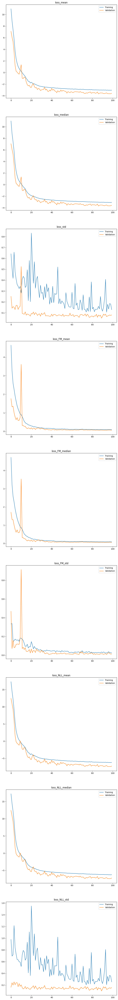

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.test()

 24%|██▍       | 48/196 [00:11<00:36,  4.03it/s]

torch.Size([250000, 10])


100%|██████████| 196/196 [00:51<00:00,  3.77it/s]


{'loss_mean': -3.6752817630767822,
 'loss_median': -3.6769790649414062,
 'loss_std': 0.07845447212457657,
 'loss_FM_mean': 0.06484507024288177,
 'loss_FM_median': 0.06162993237376213,
 'loss_FM_std': 0.013936392031610012,
 'loss_NLL_mean': -7.415408611297607,
 'loss_NLL_median': -7.4220452308654785,
 'loss_NLL_std': 0.15250007808208466}

In [ ]:
#?ModelToPosteriorCNF

In [ ]:
N_SAMPLES_PER_MODEL = 1_000

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model"
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM"
)


benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'alpha': 0.5}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_var =  (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()


                with pyro.plate("beta_plate", x.shape[1]):
                        beta = pyro.sample("beta", dist.Gamma(concentration=alpha, rate=1/beta_var))
                
                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                #print(f"beta: {beta.shape}")
                #print(f"x: {x.shape}")
                #print(f"mean: {mean.shape}")
                #print(f"sigma_squared: {sigma_squared.shape}")

                with pyro.plate("data", 

In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        full_model_no_FM,
                        vi_diag,
                        vi_multivariate_normal,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        hmc_sampler
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

torch.Size([250000, 10])
The save path is not empty and the overwrite flag is set, the results will be overwritten


In [ ]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:10<16:46, 10.17s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:20<16:49, 10.30s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:30<16:40, 10.31s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:41<16:23, 10.24s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:51<16:18, 10.30s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:01<16:04, 10.26s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:11<15:54, 10.26s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:22<15:50, 10.33s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:32<15:38, 10.31s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:42<15:24, 10.27s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:53<15:18, 10.32s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:03<15:04, 10.27s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:13<14:51, 10.24s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:23<14:45, 10.30s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:34<14:34, 10.29s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:44<14:22, 10.26s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:54<14:17, 10.33s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:05<14:05, 10.31s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:15<13:52, 10.27s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:25<13:47, 10.35s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:36<13:37, 10.34s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:46<13:25, 10.33s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:57<13:21, 10.40s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:07<13:08, 10.38s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:17<12:55, 10.34s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:27<12:43, 10.32s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:38<12:38, 10.40s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:48<12:24, 10.35s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:59<12:13, 10.33s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:09<12:06, 10.37s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:19<11:52, 10.32s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:29<11:40, 10.30s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:40<11:34, 10.37s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:50<11:20, 10.32s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:00<11:09, 10.29s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:11<11:01, 10.34s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:21<10:49, 10.31s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:31<10:37, 10.29s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:42<10:32, 10.37s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:52<10:19, 10.32s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:02<10:07, 10.30s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:13<10:00, 10.36s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:23<09:47, 10.30s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:33<09:35, 10.28s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:44<09:25, 10.27s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:54<09:17, 10.33s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:04<09:05, 10.30s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [08:14<08:54, 10.27s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [08:25<08:47, 10.34s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:35<08:36, 10.33s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:46<08:25, 10.31s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:56<08:16, 10.35s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:06<08:04, 10.31s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [09:16<07:52, 10.28s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [09:27<07:46, 10.36s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [09:37<07:34, 10.33s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:47<07:23, 10.30s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [09:58<07:14, 10.36s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [10:08<07:03, 10.32s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [10:18<06:52, 10.30s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [10:29<06:41, 10.29s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [10:39<06:33, 10.37s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [10:49<06:22, 10.34s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [11:00<06:11, 10.31s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [11:10<06:03, 10.38s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [11:21<05:51, 10.35s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [11:31<05:41, 10.34s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [11:41<05:32, 10.39s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [11:52<05:20, 10.35s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [12:02<05:09, 10.33s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [12:12<05:01, 10.39s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [12:23<04:49, 10.34s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [12:33<04:38, 10.31s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [12:43<04:29, 10.37s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [12:54<04:18, 10.35s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [13:04<04:07, 10.31s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [13:14<03:58, 10.36s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [13:25<03:47, 10.32s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [13:35<03:36, 10.30s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [13:45<03:27, 10.36s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [13:56<03:16, 10.34s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [14:06<03:05, 10.31s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [14:16<02:56, 10.37s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [14:27<02:45, 10.32s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [14:37<02:34, 10.30s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [14:47<02:24, 10.29s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [14:58<02:15, 10.40s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [15:08<02:04, 10.36s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [15:18<01:53, 10.35s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [15:29<01:43, 10.40s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [15:39<01:33, 10.35s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [15:50<01:23, 10.44s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [16:00<01:12, 10.40s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [16:10<01:02, 10.38s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [16:21<00:51, 10.36s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [16:31<00:41, 10.42s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [16:42<00:31, 10.37s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [16:52<00:20, 10.34s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [17:03<00:10, 10.42s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:12<20:12, 12.24s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:24<20:21, 12.46s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:37<20:03, 12.41s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:49<19:52, 12.42s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:02<19:46, 12.49s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:14<19:29, 12.44s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:27<19:26, 12.54s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:39<19:06, 12.47s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:52<18:54, 12.47s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:04<18:51, 12.57s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:17<18:31, 12.49s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:29<18:12, 12.42s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:42<18:06, 12.49s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:54<17:49, 12.44s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:06<17:37, 12.44s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:19<17:29, 12.49s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:31<17:10, 12.42s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:44<16:55, 12.38s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:56<16:51, 12.49s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:09<16:36, 12.45s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:21<16:20, 12.41s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:34<16:12, 12.46s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:46<15:56, 12.43s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:58<15:37, 12.34s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:11<15:31, 12.42s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:23<15:16, 12.38s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:35<15:04, 12.39s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:48<14:56, 12.45s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:00<14:40, 12.41s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:13<14:27, 12.40s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:25<14:18, 12.45s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:38<14:04, 12.41s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:50<13:51, 12.42s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:03<13:43, 12.48s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:15<13:29, 12.45s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:28<13:19, 12.49s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:40<13:02, 12.43s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [07:52<12:48, 12.40s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:05<12:38, 12.43s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:17<12:23, 12.38s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:30<12:14, 12.45s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [08:42<12:04, 12.48s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [08:54<11:49, 12.45s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:07<11:32, 12.36s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:19<11:24, 12.45s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [09:32<11:10, 12.41s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [09:44<10:56, 12.39s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [09:57<10:49, 12.48s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:09<10:35, 12.47s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:21<10:19, 12.40s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [10:34<10:11, 12.48s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [10:46<09:56, 12.43s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [10:59<09:43, 12.42s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:11<09:34, 12.49s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:24<09:22, 12.49s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [11:36<09:11, 12.53s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [11:49<08:58, 12.52s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:02<08:46, 12.53s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:14<08:33, 12.53s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [12:26<08:17, 12.44s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [12:39<08:04, 12.42s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [12:51<07:52, 12.43s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:04<07:40, 12.46s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:16<07:26, 12.42s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [13:29<07:16, 12.46s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [13:41<07:02, 12.42s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [13:53<06:48, 12.38s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:06<06:38, 12.44s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:18<06:23, 12.38s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [14:30<06:10, 12.35s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [14:43<05:59, 12.40s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [14:55<05:46, 12.38s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:07<05:33, 12.37s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [15:20<05:24, 12.47s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [15:32<05:10, 12.42s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [15:45<04:59, 12.48s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [15:57<04:45, 12.43s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:10<04:34, 12.45s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [16:23<04:23, 12.52s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [16:35<04:09, 12.49s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [16:47<03:56, 12.45s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:00<03:45, 12.51s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [17:12<03:32, 12.49s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [17:25<03:19, 12.46s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [17:38<03:08, 12.54s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [17:50<02:54, 12.47s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:02<02:42, 12.48s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [18:15<02:30, 12.57s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [18:28<02:18, 12.58s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [18:40<02:04, 12.48s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [18:52<01:52, 12.48s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:05<01:39, 12.47s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [19:17<01:26, 12.43s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [19:30<01:15, 12.53s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [19:42<01:02, 12.50s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [19:55<00:50, 12.57s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [20:08<00:37, 12.53s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [20:20<00:25, 12.52s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [20:33<00:12, 12.54s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<15:01,  9.10s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:18<15:04,  9.23s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:27<14:50,  9.18s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:36<14:37,  9.14s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:45<14:25,  9.11s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:55<14:24,  9.20s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:04<14:13,  9.17s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:13<14:03,  9.16s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:22<13:59,  9.22s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:31<13:47,  9.19s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:40<13:34,  9.15s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:49<13:23,  9.13s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [01:59<13:18,  9.18s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:08<13:05,  9.14s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:17<12:54,  9.12s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:26<12:51,  9.19s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:35<12:39,  9.15s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:44<12:27,  9.12s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [02:54<12:24,  9.19s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:03<12:14,  9.18s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:12<12:02,  9.14s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:21<11:59,  9.22s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:30<11:49,  9.21s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:40<11:37,  9.18s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [03:49<11:25,  9.14s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [03:58<11:21,  9.21s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:07<11:09,  9.17s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:16<10:59,  9.16s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:26<10:54,  9.22s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:35<10:43,  9.20s/it]

....................


Sampling posterior:  31%|███       | 31/100 [04:44<10:31,  9.15s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [04:53<10:20,  9.12s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:02<10:15,  9.18s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:11<10:04,  9.15s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:20<09:53,  9.13s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:30<09:48,  9.19s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [05:39<09:37,  9.17s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [05:48<09:26,  9.13s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [05:57<09:20,  9.20s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:06<09:09,  9.16s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:15<08:58,  9.13s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:24<08:48,  9.10s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [06:34<08:43,  9.19s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [06:43<08:32,  9.15s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [06:52<08:21,  9.12s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:01<08:16,  9.20s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:10<08:05,  9.16s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:19<07:54,  9.13s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [07:29<07:49,  9.20s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [07:38<07:38,  9.18s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [07:47<07:27,  9.14s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [07:56<07:17,  9.11s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:05<07:11,  9.17s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:14<07:00,  9.14s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [08:23<06:50,  9.13s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [08:33<06:44,  9.19s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [08:42<06:33,  9.15s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [08:51<06:22,  9.11s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:00<06:16,  9.17s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:09<06:05,  9.14s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [09:18<05:55,  9.11s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [09:28<05:49,  9.19s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [09:37<05:39,  9.17s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [09:46<05:29,  9.14s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [09:55<05:18,  9.11s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:04<05:11,  9.17s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [10:13<05:01,  9.14s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [10:22<04:51,  9.11s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [10:32<04:44,  9.19s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [10:41<04:34,  9.16s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [10:50<04:24,  9.12s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [10:59<04:17,  9.18s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [11:08<04:06,  9.14s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [11:17<03:57,  9.14s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [11:26<03:47,  9.12s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [11:36<03:40,  9.19s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [11:45<03:31,  9.19s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [11:54<03:21,  9.17s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [12:03<03:13,  9.22s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [12:12<03:04,  9.20s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [12:22<02:54,  9.16s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [12:31<02:44,  9.15s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [12:40<02:36,  9.21s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [12:49<02:26,  9.17s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [12:58<02:17,  9.14s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [13:07<02:08,  9.19s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [13:17<01:59,  9.16s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [13:26<01:49,  9.14s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [13:35<01:41,  9.21s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [13:44<01:31,  9.18s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [13:53<01:22,  9.13s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [14:02<01:12,  9.11s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [14:12<01:04,  9.17s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [14:21<00:54,  9.14s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [14:30<00:45,  9.11s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [14:39<00:36,  9.18s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [14:48<00:27,  9.15s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [14:57<00:18,  9.12s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [15:06<00:09,  9.18s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:13<22:24, 13.58s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:27<22:33, 13.81s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:41<22:16, 13.77s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:55<22:07, 13.83s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:08<21:45, 13.74s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:22<21:29, 13.72s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:36<21:24, 13.81s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:50<21:07, 13.77s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:04<20:56, 13.80s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:17<20:35, 13.73s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:31<20:28, 13.80s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:45<20:07, 13.72s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:59<19:59, 13.79s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:12<19:40, 13.73s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:26<19:24, 13.70s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:40<19:15, 13.76s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:53<18:58, 13.72s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:07<18:48, 13.76s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:21<18:31, 13.72s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:35<18:22, 13.78s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:48<18:03, 13.72s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:02<17:47, 13.68s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:16<17:36, 13.72s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:29<17:19, 13.68s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:43<17:11, 13.76s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:57<16:55, 13.72s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:11<16:45, 13.77s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:24<16:26, 13.71s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:38<16:13, 13.72s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:52<16:02, 13.75s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:05<15:46, 13.72s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:19<15:35, 13.76s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:33<15:17, 13.70s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:47<15:11, 13.81s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:01<14:54, 13.76s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:15<14:43, 13.81s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:28<14:26, 13.76s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:42<14:11, 13.73s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:56<14:01, 13.79s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:09<13:45, 13.76s/it]

....................


Sampling posterior:  41%|████      | 41/100 [09:23<13:34, 13.80s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:37<13:16, 13.74s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:51<13:07, 13.82s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:05<12:50, 13.75s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [10:18<12:35, 13.73s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [10:32<12:24, 13.78s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [10:46<12:08, 13.75s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:00<11:57, 13.80s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [11:13<11:41, 13.76s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [11:27<11:30, 13.82s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [11:41<11:13, 13.74s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [11:55<10:58, 13.71s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [12:08<10:46, 13.76s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [12:22<10:30, 13.71s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [12:36<10:19, 13.77s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [12:50<10:04, 13.74s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [13:03<09:48, 13.68s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [13:17<09:36, 13.72s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [13:31<09:20, 13.68s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [13:44<09:10, 13.76s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [13:58<08:55, 13.72s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [14:12<08:43, 13.77s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [14:26<08:28, 13.74s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [14:40<08:16, 13.80s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [14:53<08:02, 13.78s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [15:07<07:49, 13.81s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [15:21<07:33, 13.75s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [15:35<07:19, 13.73s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [15:48<07:07, 13.79s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [16:02<06:52, 13.74s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [16:16<06:40, 13.80s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [16:30<06:25, 13.76s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [16:43<06:10, 13.71s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [16:57<05:58, 13.78s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [17:11<05:43, 13.74s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [17:25<05:31, 13.83s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [17:39<05:17, 13.81s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [17:53<05:05, 13.88s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [18:06<04:50, 13.81s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [18:20<04:36, 13.84s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [18:34<04:21, 13.77s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [18:48<04:07, 13.75s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [19:02<03:54, 13.80s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [19:15<03:40, 13.76s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [19:29<03:27, 13.81s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [19:43<03:12, 13.76s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [19:57<02:58, 13.76s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [20:10<02:45, 13.81s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [20:24<02:31, 13.77s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [20:38<02:18, 13.81s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [20:52<02:03, 13.77s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [21:06<01:50, 13.84s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [21:19<01:36, 13.79s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [21:33<01:22, 13.83s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [21:47<01:08, 13.79s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [22:01<00:55, 13.80s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [22:15<00:41, 13.85s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [22:29<00:27, 13.85s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [22:43<00:13, 13.90s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:16<26:49, 16.25s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:32<26:06, 15.99s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:48<25:55, 16.04s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:03<25:31, 15.96s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:20<25:29, 16.10s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:36<25:05, 16.02s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:52<24:55, 16.08s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:08<24:34, 16.02s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:24<24:19, 16.04s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:40<24:04, 16.05s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:56<23:43, 15.99s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:12<23:37, 16.11s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:28<23:12, 16.01s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:44<23:02, 16.07s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:00<22:40, 16.00s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:16<22:33, 16.12s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:32<22:14, 16.08s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:49<21:59, 16.09s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:05<21:42, 16.08s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:21<21:35, 16.19s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:37<21:14, 16.13s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:53<20:58, 16.13s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:09<20:40, 16.11s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:25<20:27, 16.15s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:41<20:06, 16.08s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:57<19:50, 16.08s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:13<19:31, 16.04s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:30<19:19, 16.11s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:46<18:59, 16.04s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:02<18:45, 16.09s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:18<18:24, 16.01s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:34<18:12, 16.06s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [08:49<17:49, 15.96s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:06<17:39, 16.05s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:22<17:19, 15.99s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [09:38<17:07, 16.05s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [09:54<16:46, 15.97s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:10<16:40, 16.14s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:26<16:19, 16.06s/it]

....................


Sampling posterior:  40%|████      | 40/100 [10:42<16:03, 16.05s/it]

....................


Sampling posterior:  41%|████      | 41/100 [10:58<15:51, 16.13s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:15<15:36, 16.15s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:31<15:25, 16.23s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [11:47<15:03, 16.14s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:03<14:50, 16.19s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [12:19<14:28, 16.07s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [12:35<14:14, 16.12s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [12:51<13:58, 16.12s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:08<13:46, 16.20s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [13:24<13:25, 16.11s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [13:40<13:07, 16.07s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [13:56<12:50, 16.05s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [14:12<12:42, 16.23s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [14:28<12:23, 16.17s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [14:45<12:08, 16.19s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:01<11:51, 16.18s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [15:17<11:36, 16.19s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [15:33<11:16, 16.11s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [15:49<10:59, 16.09s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [16:05<10:42, 16.06s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [16:21<10:26, 16.05s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [16:37<10:07, 15.98s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [16:53<09:53, 16.03s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [17:09<09:35, 16.00s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [17:25<09:18, 15.94s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [17:41<09:04, 16.01s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [17:57<08:52, 16.13s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [18:13<08:33, 16.05s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [18:29<08:20, 16.14s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [18:45<08:00, 16.02s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [19:01<07:46, 16.10s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [19:17<07:27, 15.98s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [19:33<07:13, 16.07s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [19:49<06:55, 16.00s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [20:05<06:41, 16.07s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [20:21<06:24, 16.01s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [20:37<06:09, 16.05s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [20:54<05:53, 16.07s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [21:10<05:39, 16.15s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [21:26<05:21, 16.09s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [21:42<05:07, 16.17s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [21:58<04:50, 16.13s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [22:14<04:34, 16.12s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [22:30<04:16, 16.06s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [22:47<04:02, 16.14s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [23:03<03:47, 16.25s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [23:19<03:31, 16.25s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [23:35<03:13, 16.14s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [23:51<02:57, 16.16s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [24:07<02:40, 16.08s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [24:24<02:25, 16.15s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [24:40<02:08, 16.10s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [24:56<01:53, 16.18s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [25:12<01:37, 16.18s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [25:28<01:20, 16.08s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [25:44<01:04, 16.14s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [26:01<00:48, 16.18s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [26:17<00:32, 16.24s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [26:33<00:16, 16.14s/it]

....................


100%|██████████| 100/100 [00:00<00:00, 642.78it/s]


An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [05:31<00:00,  3.32s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,17.947489,0.051652,0.52320,4.563672,0.113575,0.109245,0.002457,0.000047,0.033405,19.439576,0.052436,0.051522
1,full_model_no_FM,gt,17.966984,0.051554,0.52265,6.337484,0.125850,0.108841,0.011735,0.000064,0.030850,4.822837,0.121808,0.054225
2,Variational Inference with guide: AutoDiagonal...,gt,17.940290,0.051533,0.55485,-9.347071,0.135889,0.134673,0.001824,0.000027,0.032547,31.163368,0.087661,0.085276
3,Variational Inference with guide: AutoMultivar...,gt,17.939734,0.051456,0.55425,0.207286,0.152089,0.152339,0.002626,0.000035,0.031618,14.911684,0.137998,0.139088
4,Variational Inference with guide: AutoLaplaceA...,gt,17.931576,0.051528,0.61305,NaN,NaN,0.110153,0.000000,0.000000,0.032867,NaN,NaN,0.053243
5,Variational Inference with guide: AutoIAFNorma...,gt,17.930709,0.051658,0.58640,-7.696806,0.173906,0.176325,0.010617,0.000080,0.032146,77.687521,0.119153,0.117321
6,Variational Inference with guide: AutoStructur...,gt,17.938024,0.051511,0.54610,-1.328369,0.155477,0.154683,0.003170,0.000041,0.032071,30.773326,0.128467,0.130511
7,Hamiltonian Monte Carlo,gt,17.945576,0.051564,0.51360,8.741958,0.107519,0.101836,0.001909,0.000041,0.030913,4.453913,0.058066,0.052584


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,3.896560e-18,1.236757e-14,9.127944e-01,7.991587e-01,1.068370e-01,5.069485e-01
1,full_model,Variational Inference with guide: AutoDiagonal...,4.016156e-18,3.895900e-18,7.997010e-08,1.142002e-13,1.860235e-03,2.240636e-05
2,full_model,Variational Inference with guide: AutoMultivar...,3.896340e-18,3.895021e-18,4.380465e-08,3.018823e-04,1.718343e-02,7.343172e-04
3,full_model,Variational Inference with guide: AutoLaplaceA...,3.896340e-18,3.894582e-18,5.098531e-18,NaN,NaN,1.467874e-01
4,full_model,Variational Inference with guide: AutoIAFNorma...,1.379994e-15,7.991573e-01,6.110270e-17,7.696540e-08,3.271560e-09,6.164489e-11
5,full_model,Variational Inference with guide: AutoStructur...,5.766882e-18,3.894802e-18,1.006536e-06,4.137420e-04,6.080234e-04,6.275353e-05
6,full_model,Hamiltonian Monte Carlo,1.153177e-06,2.135716e-16,4.877495e-02,6.431316e-14,5.815642e-02,2.101315e-04
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.896560e-18,6.137096e-03,3.964385e-08,2.836409e-14,1.304749e-02,2.902260e-05
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,3.896560e-18,2.327632e-16,8.372628e-10,1.512342e-04,1.467874e-01,5.492396e-04
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,1.700323e-04,4.243092e-18,NaN,NaN,2.637996e-01



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,full_model,full_model_no_FM,0.373396,0.099970,0.651010,0.962184,0.208811,0.091259
1,full_model,Variational Inference with guide: AutoDiagonal...,0.483528,1.320421,0.973620,0.346551,0.837704,0.018827
2,full_model,Variational Inference with guide: AutoMultivar...,0.577593,1.049245,0.950180,0.751109,1.201509,0.034929
3,full_model,Variational Inference with guide: AutoLaplaceA...,0.496236,2.566499,1.000000,0.156177,0.535333,0.000000
4,full_model,Variational Inference with guide: AutoIAFNorma...,0.739579,1.332620,0.960405,0.613499,1.056484,0.031888
5,full_model,Variational Inference with guide: AutoStructur...,0.577076,1.077768,0.949910,0.650570,1.177176,0.035793
6,full_model,Hamiltonian Monte Carlo,0.318238,0.293536,0.909010,0.121557,0.344298,0.043361
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.575322,1.246576,0.972440,0.996718,0.782732,0.015467
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,0.660985,0.979361,0.945245,1.177058,1.181795,0.034229
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,0.608866,2.453258,0.999995,0.991338,0.499619,0.000050


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,5.178054e-15,3.737080e-33,4.783635e-33
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoMultivar...,3.891648e-11,1.283984e-32,7.013759e-33
2,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoLaplaceA...,2.384093e-23,2.562144e-34,2.155931e-38
3,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoIAFNorma...,4.055195e-22,1.647915e-31,5.128612e-33
4,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoStructur...,2.703103e-11,1.719949e-32,7.114117e-33
...,...,...,...,...,...,...,...
163,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,1.726489e-03,6.047057e-15,3.027718e-37
164,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,1.028206e-03,3.401867e-20,1.460963e-35
165,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,4.123547e-01,8.440679e-01,1.859252e-03
166,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,4.378014e-05,3.816247e-05,2.512860e-01


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2  Variational Inference with guide: AutoDiagonal...  gt   
  3  Variational Inference with guide: AutoMultivar...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  7                            Hamiltonian Monte Carlo  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          17.947489            0.051652   
  1                                          17.966984            0.051554   
  2                                          17.940290            0.051533   
  3                                          17.939734            0.051456   
  4    

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

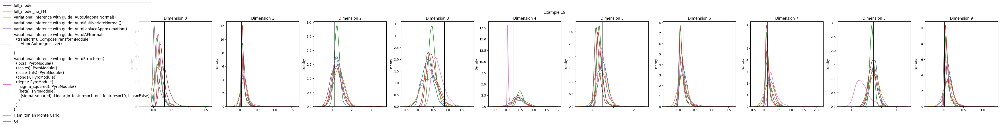

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

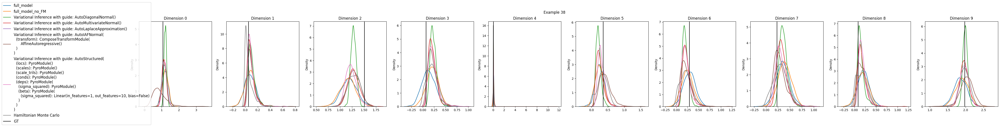

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

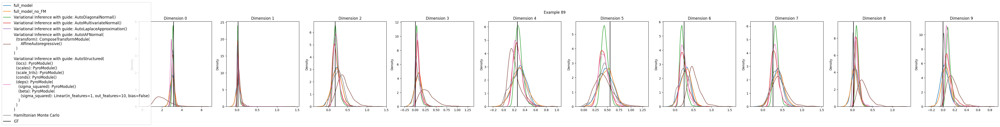

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

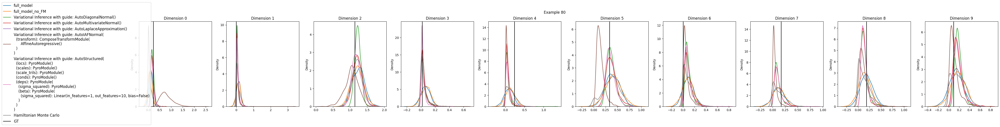

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

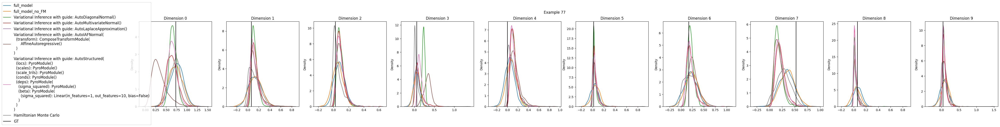

In [ ]:
evaluation.plot_results()